In [1]:
%run methods_sulfate_deposition.ipynb

/Users/feliciacarlborg/opt/anaconda3/lib/python3.8/site-packages/nbformat/__init__.py:92: MissingIDFieldWarning: Code cell is missing an id field, this will become a hard error in future nbformat versions. You may want to use `normalize()` on your notebooks before validations (available since nbformat 5.1.4). Previous versions of nbformat are fixing this issue transparently, and will stop doing so in the future.
  validate(nb)


In [2]:
%matplotlib inline
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import scipy as scipy
import warnings 
from tabulate import tabulate
from scipy import interpolate
from scipy import signal
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
import itertools
from tqdm import tqdm
import seaborn as sns
from scipy.stats.stats import pearsonr
from itertools import zip_longest

from matplotlib.widgets import Slider, RadioButtons

np.set_printoptions(threshold=np.inf)
sns.set_theme(context='paper', style='white', palette='colorblind',font='helvetica')

## Bipolar eruptions

In [3]:
exc_sheet_bp_mp = pd.ExcelFile('Bipolar match points ver 2022-12-23.xls')
bp_mp = pd.read_excel(exc_sheet_bp_mp, 'Sheet1')
bp_mp = np.array(bp_mp)

depth_bp_NGRIP = np.array(bp_mp[:,0], dtype='float64')
depth_bp_NEEM = np.array(bp_mp[:,4], dtype='float64')

#can't use nan values for interpolation
depth_bp_NEEM = depth_bp_NEEM[np.isfinite(depth_bp_NGRIP)]
depth_bp_NGRIP = depth_bp_NGRIP[np.isfinite(depth_bp_NGRIP)]
depth_bp_NGRIP = depth_bp_NGRIP[np.isfinite(depth_bp_NEEM)]
depth_bp_NEEM = depth_bp_NEEM[np.isfinite(depth_bp_NEEM)]

In [4]:
### Downloading the files from Excel ###
sheet5 = pd.ExcelFile('NEEM_sulfate_on_GICC05.xls')
NEEM = pd.read_excel(sheet5, 'Sheet1') 
sheet6 = pd.ExcelFile('2013-12-05GICC05modelext-NEEM-1.xls')
thinning = pd.read_excel(sheet6, '7) Strain model')
sheet7 = pd.ExcelFile('NEEM_d18O_on_GICC05.xls')
d18O = pd.read_excel(sheet7, 'Sheet1')

Stored 'NEEM_thinning' (ndarray)
Stored 'NEEM_thinning_depth' (ndarray)
Stored 'NEEM_d18O_depth' (ndarray)
Stored 'NEEM_d18O' (ndarray)
Stored 'NEEM_d18O_age' (ndarray)
Stored 'NEEM_age_copy' (ndarray)


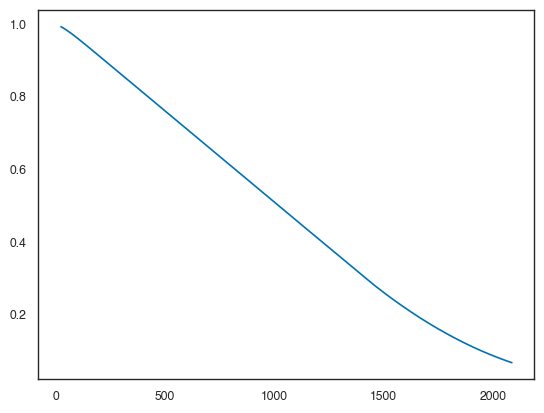

In [5]:
### Pandas to arrays ### 
NEEM = np.array(NEEM)
thinning = np.array(thinning)
d18O = np.array(d18O)

### Retrieving different data sets ###
NEEM_age = NEEM[:,12]
NEEM_sulfate = NEEM[:,10]
NEEM_depth_top = NEEM[:,0]
NEEM_depth_bottom = NEEM[:,1]
NEEM_thickness = NEEM_depth_bottom - NEEM_depth_top

NEEM_thinning_depth = thinning[1:,0]
NEEM_thinning = thinning[1:,1]

NEEM_acc = np.array(thinning[1:,3], dtype='float64')

NEEM_d18O_depth = d18O[:,0]
NEEM_d18O = d18O[:,1]
NEEM_d18O_age = d18O[:,4]

NEEM_annual = np.arange(10209,122087,1)

NEEM_thinning = np.array(NEEM_thinning, dtype='float64')
NEEM_thinning_depth = np.array(NEEM_thinning_depth, dtype='float64')
NEEM_depth = (np.sum( (NEEM_depth_bottom, NEEM_depth_top), axis=0)/2) -0.1


NEEM_age_copy = np.copy(NEEM_age)

%store -r NEEM_ECM_depth
%store -r NEEM_ECM
%store -r depths_lost_NEEM
%store  NEEM_thinning
%store  NEEM_thinning_depth
%store NEEM_d18O_depth
%store NEEM_d18O 
%store NEEM_d18O_age
%store NEEM_age_copy

plt.figure()
plt.plot(NEEM_thinning_depth, NEEM_thinning)

## Original GICC05 timescale from NGRIP - So that all depths correspond to the correct age 

In [6]:
## Downloading data
excel = pd.ExcelFile('2010-11-19 GICC05modelext for NGRIP 2.xls')
GICC05 = pd.read_excel(excel, 'GICC05')
GICC05= np.array(GICC05)

NGRIP_age_GICC05 = np.array(GICC05[70:, 0], dtype='float64')
NGRIP_depth_GICC05 = np.array(GICC05[70:, 1], dtype='float64')

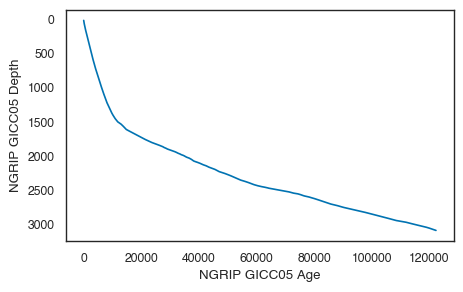

In [7]:
## This is the GICC05 timeseries that we want all our cores to be in. 
plt.figure(figsize=(5,3))
plt.plot(NGRIP_age_GICC05, NGRIP_depth_GICC05)
plt.xlabel('NGRIP GICC05 Age')
plt.ylabel('NGRIP GICC05 Depth')
plt.gca().invert_yaxis()

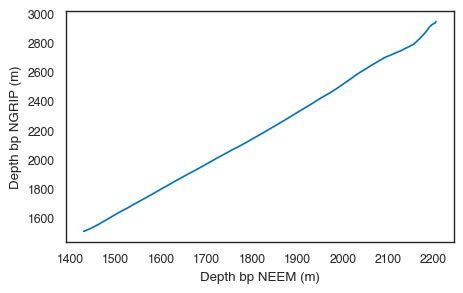

In [8]:
## This is along the points we want to start our first interpolation since they are connected.
plt.figure(figsize=(5,3)) 
plt.plot(depth_bp_NEEM, depth_bp_NGRIP)
plt.xlabel('Depth bp NEEM (m)')
plt.ylabel('Depth bp NGRIP (m)')

plt.show()

In [9]:
#1. first interpolation. We want a new correspoding depth in NGRIP to fit the depth with NEEM. 
lim_NEEM = (NEEM_depth > 1428.2) & (NEEM_depth < 2206)
NGRIP_depth_new_cs = interpolate.interp1d(depth_bp_NEEM, depth_bp_NGRIP, fill_value='extrapolate') ##interpolation so I get new depth for NGRIP
NGRIP_depth_new = NGRIP_depth_new_cs(  NEEM_depth[ lim_NEEM ])

Text(0, 0.5, 'NGRIP depth (new)')

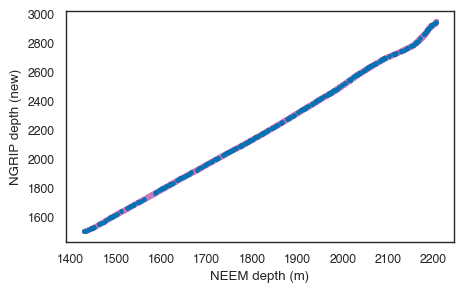

In [10]:
##The interpolated updated NGRIP depth
%matplotlib inline
plt.figure(figsize=(5,3))
plt.plot(NEEM_depth[lim_NEEM], NGRIP_depth_new , 'm.')
plt.plot(depth_bp_NEEM, depth_bp_NGRIP, '.')
plt.xlabel('NEEM depth (m)')
plt.ylabel('NGRIP depth (new)')

In [11]:
NGRIP_depth_GICC05[-1],NGRIP_depth_new[-1]

(3084.73, 2950.548864150943)

In [12]:
#2. Second interpolation. Getting the EDML GICC05 age correct (that corresponds to our updated NGRIP depth (that corresponds to the depth of NEEM))
NEEM_age_new_int = interpolate.Akima1DInterpolator(NGRIP_depth_GICC05, NGRIP_age_GICC05) ##Interpolation so I get the new age for NEEM
NEEM_age_new = NEEM_age_new_int(NGRIP_depth_new)

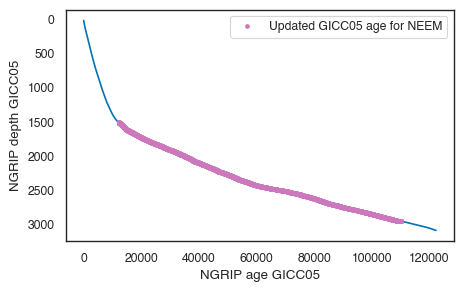

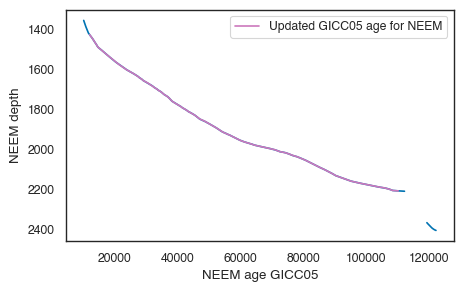

In [13]:
%matplotlib inline
## The new NEEM age vs the updated NGRIP depth (that corresponds to NEEM depth)
plt.figure(figsize=(5,3))
plt.plot(NGRIP_age_GICC05, NGRIP_depth_GICC05)
plt.plot(NEEM_age_new, NGRIP_depth_new, 'm.', label='Updated GICC05 age for NEEM')
plt.ylabel('NGRIP depth GICC05')
plt.xlabel('NGRIP age GICC05')
plt.gca().invert_yaxis()
plt.legend()

##updated NEEM age for corresponding original NEEM depth 
plt.figure(figsize=(5,3))
plt.plot(NEEM_age, NEEM_depth)
plt.plot(NEEM_age_new, NEEM_depth[lim_NEEM], 'm-', label='Updated GICC05 age for NEEM', markersize=3)
plt.ylabel('NEEM depth')
plt.xlabel('NEEM age GICC05')
plt.gca().invert_yaxis()
plt.legend()

In [14]:
#storing the updated EDML_age 
%store NEEM_age_new

NEEM_age = np.copy(NEEM_age_new)

Stored 'NEEM_age_new' (ndarray)


## Accumulation rate

(0.06566562416628675, 0.030076399901819154, 0.12779979589818163)

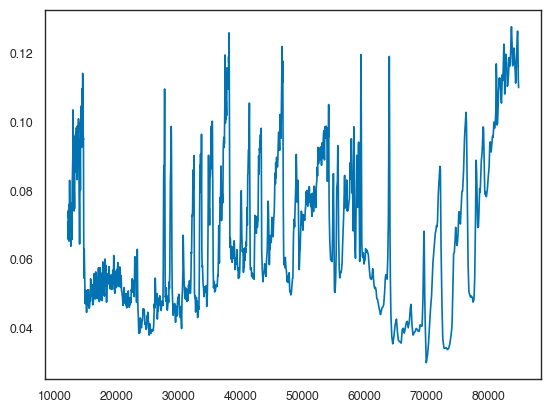

In [15]:
NEEM_acc_corr = np.interp(NEEM_depth[lim_NEEM], NEEM_thinning_depth, NEEM_acc)

plt.figure()
plt.plot(NEEM_age, NEEM_acc_corr )

NEEM_acc_mean = np.nanmean(NEEM_acc_corr)
NEEM_acc_min = np.nanmin(NEEM_acc_corr)
NEEM_acc_max = np.nanmax(NEEM_acc_corr)

NEEM_acc_mean, NEEM_acc_min, NEEM_acc_max

In [16]:
len(NEEM_age), len(NEEM_sulfate[lim_NEEM])

(9727, 9727)

In [17]:
NEEM_filt = 181 #running median filter NGRIP
NEEM_exl_volc = exl_volcanism(NEEM_age, NEEM_sulfate[lim_NEEM], NEEM_filt, 3)
NEEM_RM = running_median(NEEM_age, NEEM_sulfate[lim_NEEM], NEEM_filt)
NEEM_RRM = running_median(NEEM_age, NEEM_exl_volc, NEEM_filt)
NEEM_RMAD = median_of_absolute_deviation(NEEM_age,  NEEM_exl_volc, NEEM_filt, z=3)

In [18]:
thresholds = np.arange(.5,4.5,.5)

all_RMAD_NEEM = np.zeros((len(NEEM_age), len(thresholds)))
all_RRM_NEEM = np.zeros((len(NEEM_age), len(thresholds)))

for i in range(len(thresholds)):
    NEEM_exl_volc_test = exl_volcanism(NEEM_age, NEEM_sulfate[lim_NEEM],NEEM_filt,thresholds[i])
    NEEM_RRM_test = running_median(NEEM_age, NEEM_exl_volc_test, NEEM_filt)
    NEEM_RMAD_test = median_of_absolute_deviation(NEEM_age,  NEEM_exl_volc_test, NEEM_filt, thresholds[i])
    all_RRM_NEEM[:,i] = NEEM_RRM_test
    all_RMAD_NEEM[:,i] = NEEM_RMAD_test

In [19]:
np.shape(all_RMAD_NEEM), len(NEEM_age)

((9727, 8), 9727)

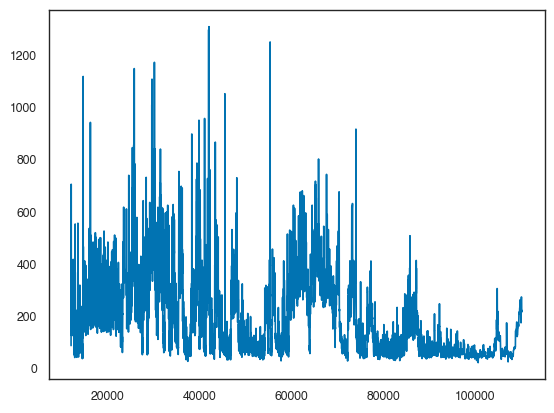

In [20]:
plt.figure()
plt.plot(NEEM_age, NEEM_sulfate[lim_NEEM])

In [21]:
#all_RRM_NEEM = np.array(all_RRM_NEEM)
#all_RMAD_NEEM = np.array(all_RMAD_NEEM)

%store all_RMAD_NEEM
%store all_RRM_NEEM

Stored 'all_RMAD_NEEM' (ndarray)
Stored 'all_RRM_NEEM' (ndarray)


In [22]:
len(NEEM_age), len(NEEM_sulfate[lim_NEEM])

(9727, 9727)

Stored 'NEEM_RRM' (ndarray)
Stored 'NEEM_sulfate' (ndarray)
Stored 'NEEM_age' (ndarray)
Stored 'NEEM_depth' (ndarray)
Stored 'NEEM_thickness' (ndarray)
Stored 'NEEM_thinning_corr' (ndarray)
Stored 'NEEM_RMAD' (ndarray)
Stored 'NEEM_depth_top' (ndarray)
Stored 'NEEM_depth_bottom' (ndarray)


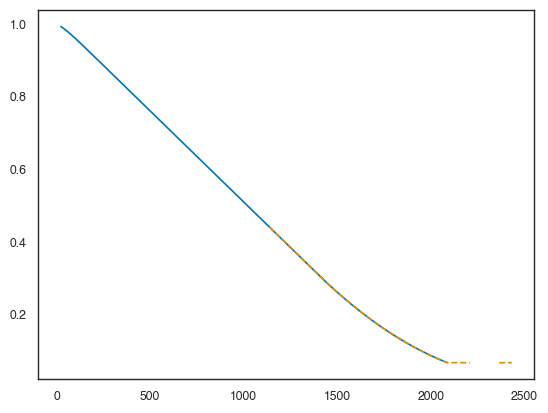

(array([2431.00075, 2431.1255 , 2431.2505 , 2431.3755 , 2431.5005 ,
        2431.6255 , 2431.7505 , 2431.8795 , 2431.99975, 2432.10725]),
 array([2082.3 , 2082.85, 2083.4 , 2083.95, 2084.5 , 2085.05, 2085.6 ,
        2086.15, 2086.7 , 2087.25]))

In [23]:
### Thinning with depth so it matches my data set ###
NEEM_depth = (np.sum( (NEEM_depth_bottom, NEEM_depth_top), axis=0)/2) -0.1
NEEM_thinning_corr= np.interp(NEEM_depth, NEEM_thinning_depth, NEEM_thinning)
NEEM_depth = NEEM_depth 

%store NEEM_RRM
%store NEEM_sulfate
%store NEEM_age
%store NEEM_depth
%store NEEM_thickness
%store NEEM_thinning_corr
%store NEEM_RMAD
%store NEEM_depth_top
%store NEEM_depth_bottom

plt.figure()
plt.plot(NEEM_thinning_depth, NEEM_thinning)
plt.plot(NEEM_depth, NEEM_thinning_corr, '--')
plt.show()

NEEM_depth[-10:], NEEM_thinning_depth[-10:]

In [24]:
len(NEEM_annual), len(NEEM_age), len(NEEM_depth_top), len(NEEM_thickness)

(111878, 9727, 11446, 11446)

In [25]:
### Annual depth values ### 
lim_NEEM = (NEEM_depth > 1428.2) & (NEEM_depth < 2206)
NEEM_annual_depth_top = np.interp(NEEM_annual, NEEM_age, NEEM_depth_top[lim_NEEM])
NEEM_annual_depth_bottom= np.interp(NEEM_annual, NEEM_age, NEEM_depth_bottom[lim_NEEM])
### Annual thinning values ###
NEEM_annual_thinning_top = np.interp(NEEM_annual_depth_top, NEEM_thinning_depth, NEEM_thinning)
NEEM_annual_thinning_bottom = np.interp(NEEM_annual_depth_bottom, NEEM_thinning_depth, NEEM_thinning)

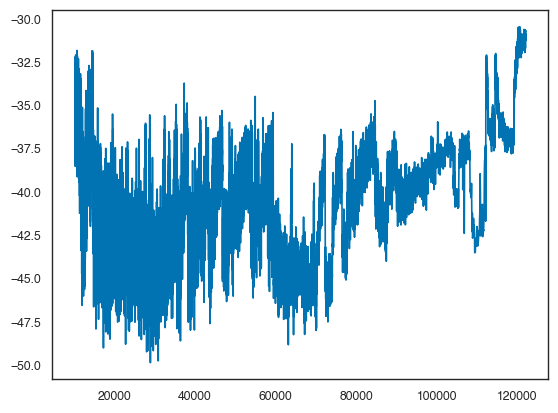

In [26]:
plt.figure()
plt.plot(NEEM_d18O_age, NEEM_d18O)

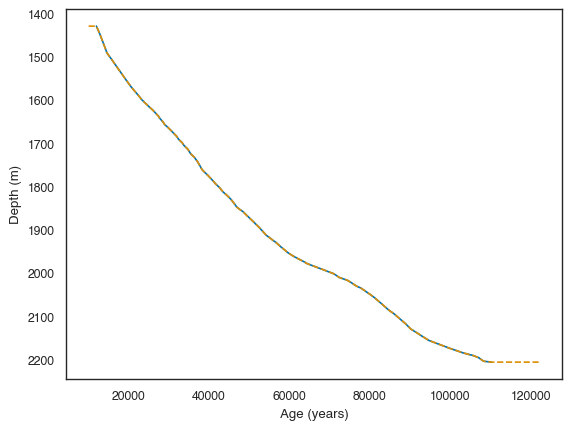

In [27]:
plt.figure()
plt.plot(NEEM_age, NEEM_depth_bottom[lim_NEEM])
plt.plot(NEEM_annual, NEEM_annual_depth_bottom, '--')
plt.xlabel('Age (years)')
plt.ylabel('Depth (m)')
plt.gca().invert_yaxis()

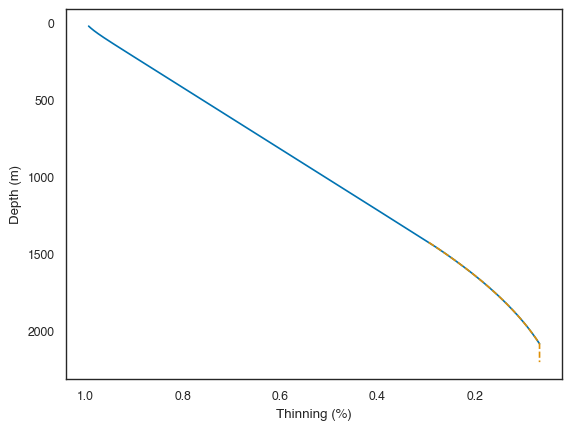

In [28]:
plt.figure()
plt.plot(NEEM_thinning, NEEM_thinning_depth)
plt.plot(NEEM_annual_thinning_bottom,NEEM_annual_depth_bottom, '--')
plt.ylabel('Depth (m)')
plt.xlabel('Thinning (%)')
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()

In [29]:
%%time
NEEM_annual = np.arange(10209,122087,1)
NEEM_filt = 181
#NEEM_annual_sulfate, NEEM_annual_thickness = annual_average(NEEM_annual, NEEM_age, NEEM_sulfate, NEEM_thickness)
#NEEM_sulfate_interp = interp(NEEM_sulfate)
NEEM_RM = running_median(NEEM_age, NEEM_sulfate[lim_NEEM], NEEM_filt)
NEEM_MAD = median_of_absolute_deviation(NEEM_age, NEEM_sulfate[lim_NEEM], NEEM_filt)
NEEM_excl_volc = exl_volcanism(NEEM_age, NEEM_sulfate[lim_NEEM], NEEM_filt,3)
NEEM_RRM = running_median(NEEM_age, NEEM_excl_volc, NEEM_filt)
NEEM_RMAD = median_of_absolute_deviation(NEEM_age, NEEM_excl_volc, NEEM_filt)

CPU times: user 3.57 s, sys: 7.92 ms, total: 3.58 s
Wall time: 3.59 s


In [30]:
len(NEEM_annual), len(NEEM_RRM)

(111878, 9727)

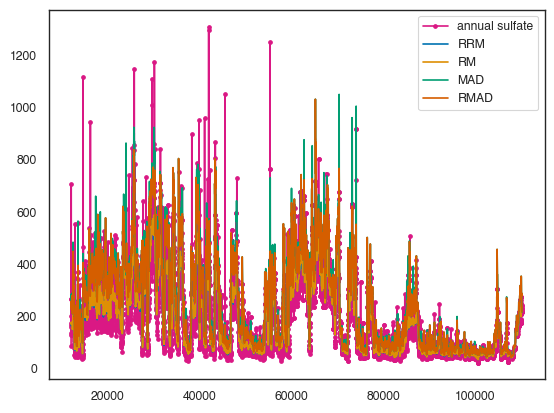

In [31]:
#mask = np.isfinite( NEEM_annual_sulfate)
plt.figure()
plt.plot(NEEM_age, NEEM_sulfate[lim_NEEM], label='annual sulfate', c='#da1884', marker='.')
plt.plot(NEEM_age, NEEM_RRM,  label='RRM')
plt.plot(NEEM_age, NEEM_RM,label='RM')
plt.plot(NEEM_age, NEEM_MAD, label='MAD')
plt.plot(NEEM_age, NEEM_RMAD, label = 'RMAD')
plt.legend()
plt.show()

In [32]:
## Lists for loop ## 
NEEM_annual = np.arange(10209,122087,1)#annual array
NEEM_age_list = np.arange(10*1e3,124*1e3,1000) #list with ages for the different intervals

In [33]:
depths_lost_NEEM

array([1527.45 , 1688.83 , 1587.2  , 1847.62 , 2103.2  , 1849.1  ,
       1467.49 , 1863.15 , 1484.035, 1740.25 , 1742.65 , 2128.87 ,
       1876.39 , 2134.9  , 1882.7  , 1764.25 , 1642.78 , 1911.415])

  0%|          | 0/113 [00:00<?, ?it/s]

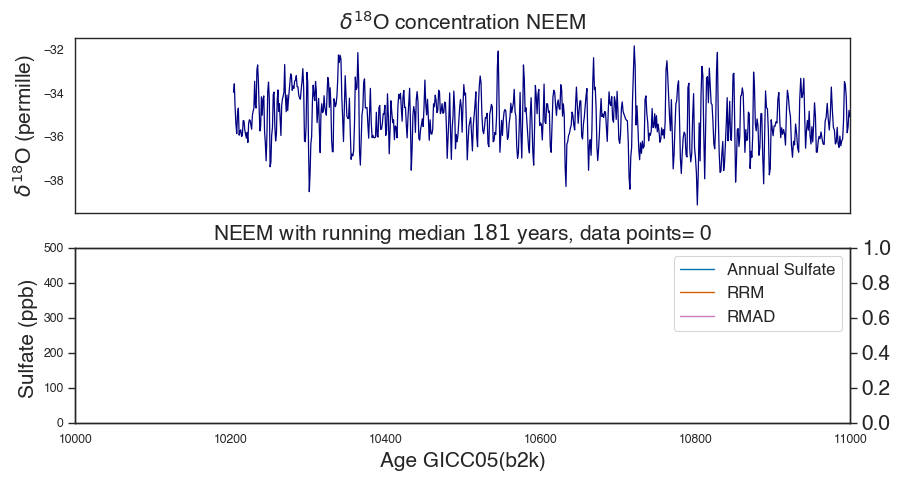

  1%|          | 1/113 [00:00<00:44,  2.49it/s]

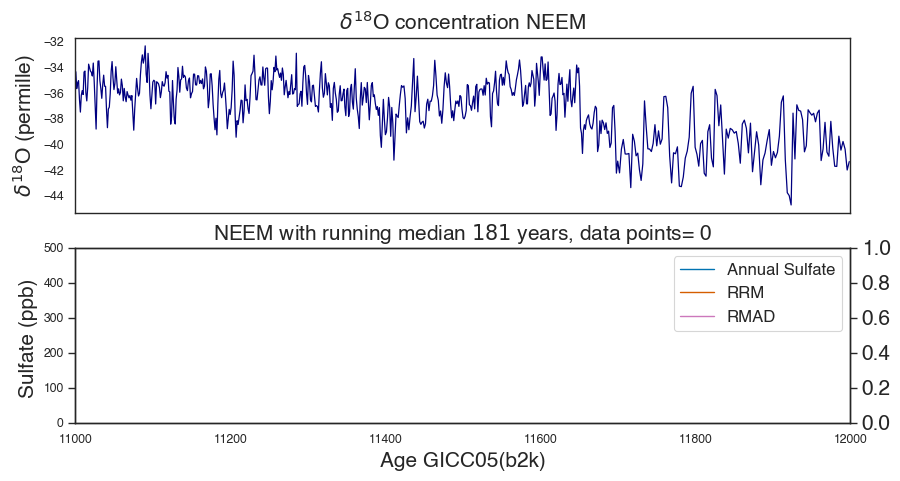

  2%|▏         | 2/113 [00:00<00:35,  3.08it/s]

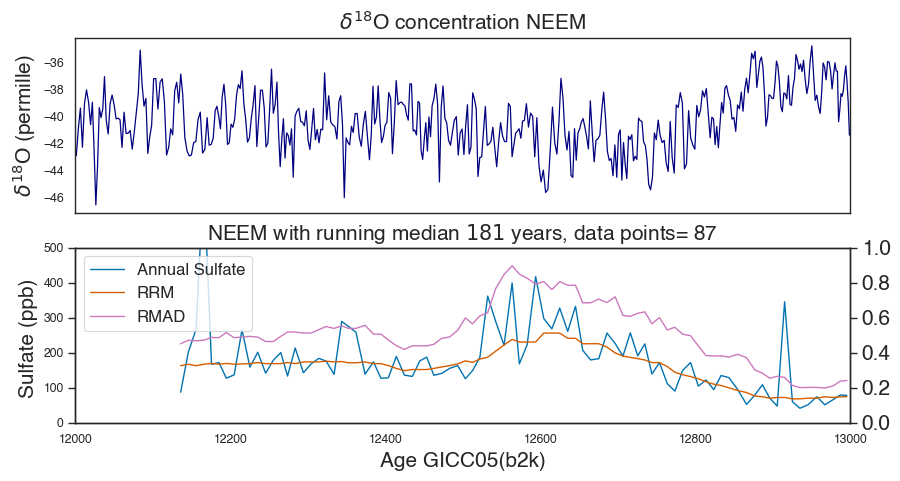

  3%|▎         | 3/113 [00:00<00:30,  3.60it/s]

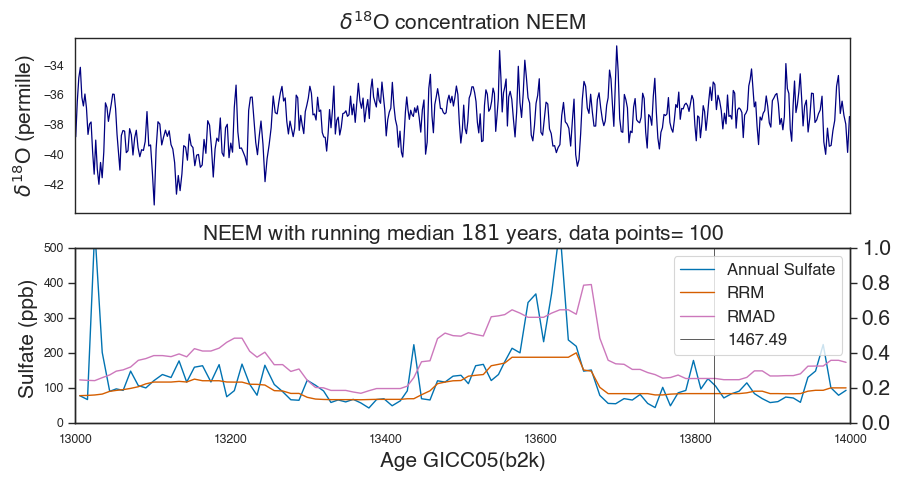

  4%|▎         | 4/113 [00:01<00:33,  3.30it/s]

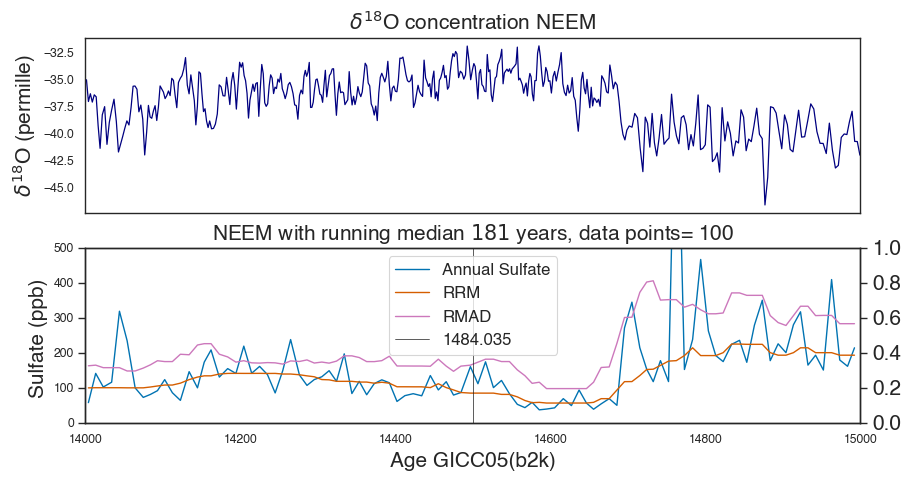

  4%|▍         | 5/113 [00:01<00:29,  3.60it/s]

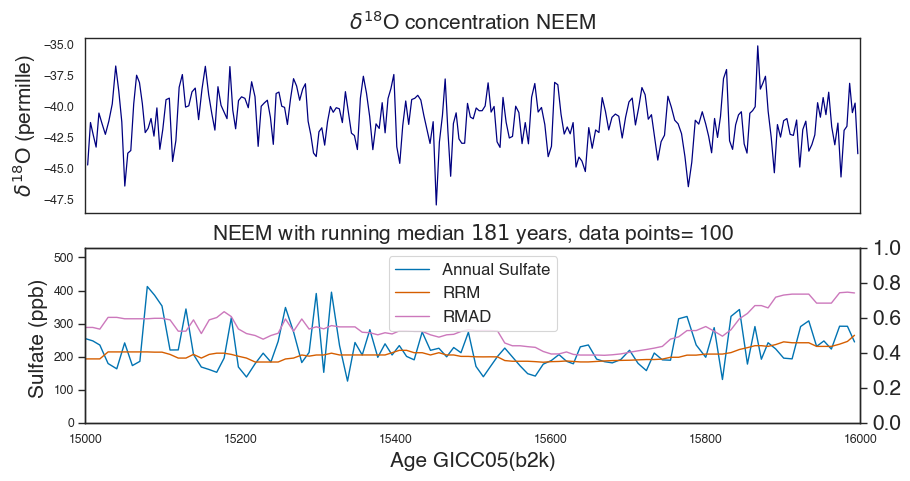

  5%|▌         | 6/113 [00:01<00:26,  3.96it/s]

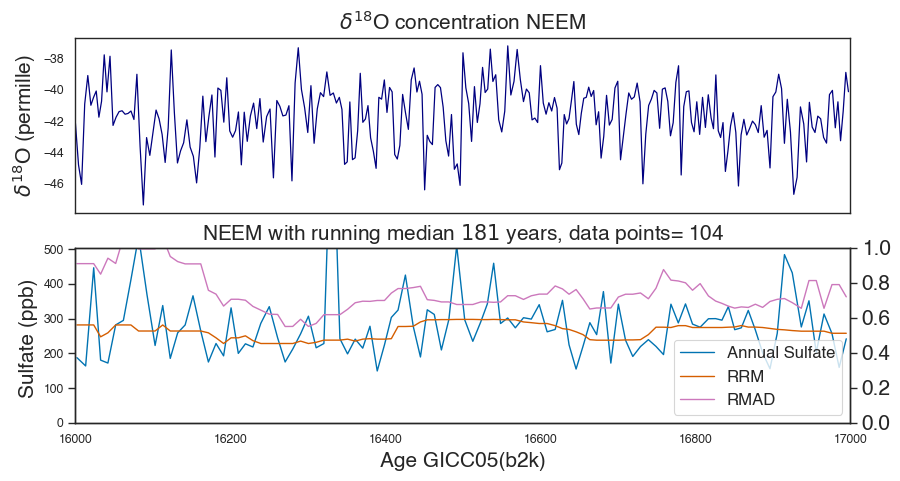

  6%|▌         | 7/113 [00:01<00:25,  4.23it/s]

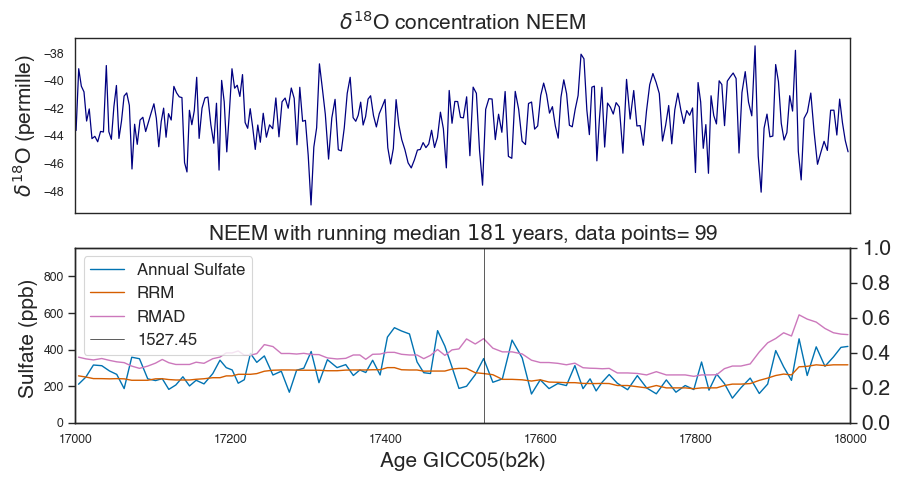

  7%|▋         | 8/113 [00:02<00:23,  4.47it/s]

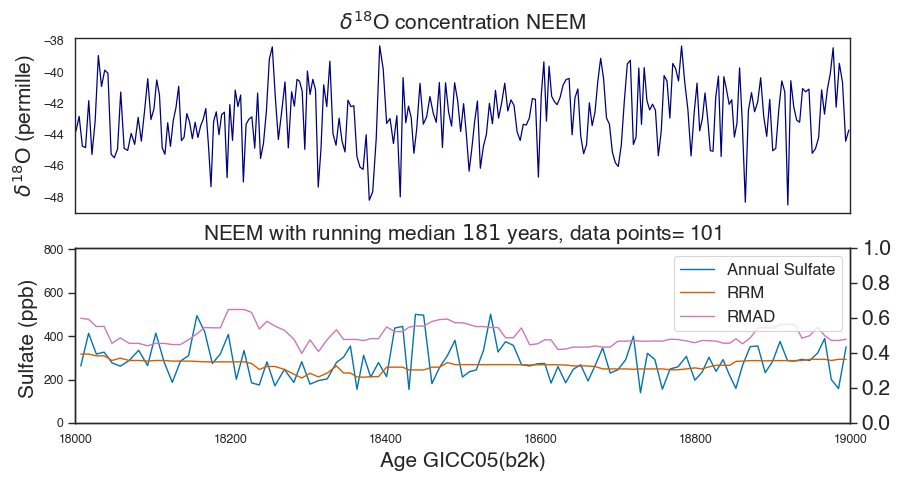

  8%|▊         | 9/113 [00:02<00:23,  4.51it/s]

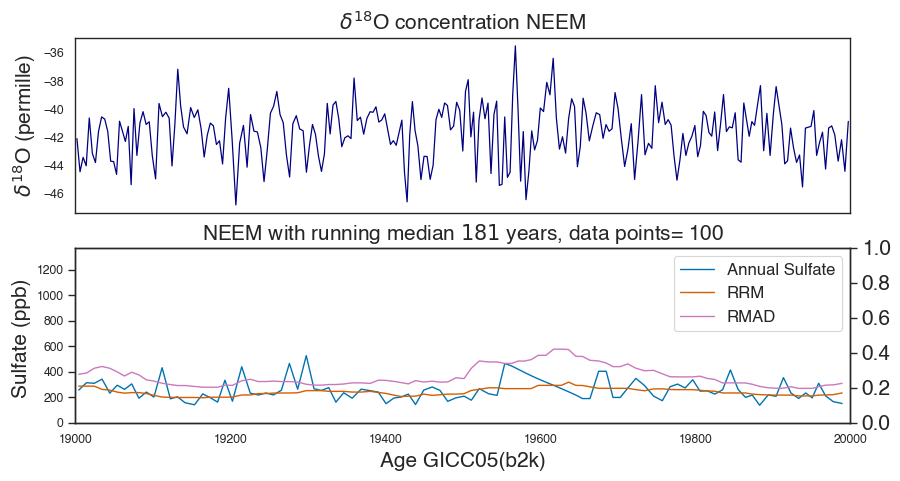

  9%|▉         | 10/113 [00:02<00:21,  4.71it/s]

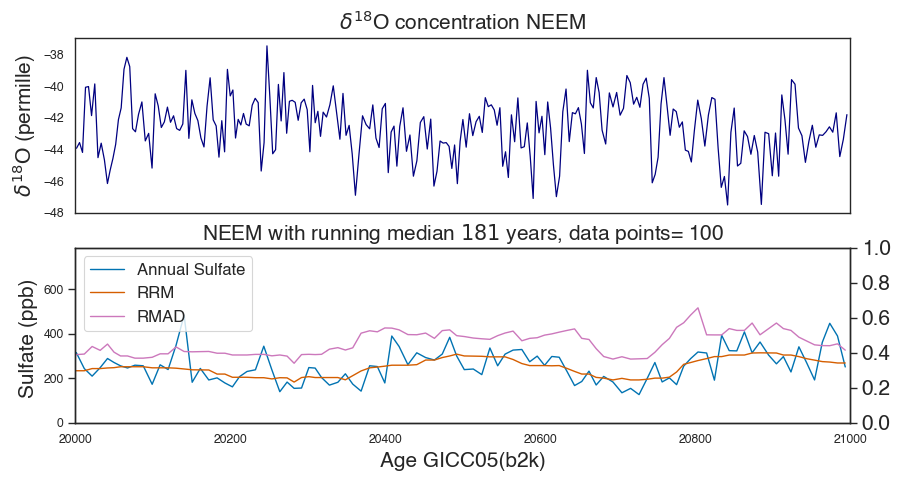

 10%|▉         | 11/113 [00:02<00:21,  4.81it/s]

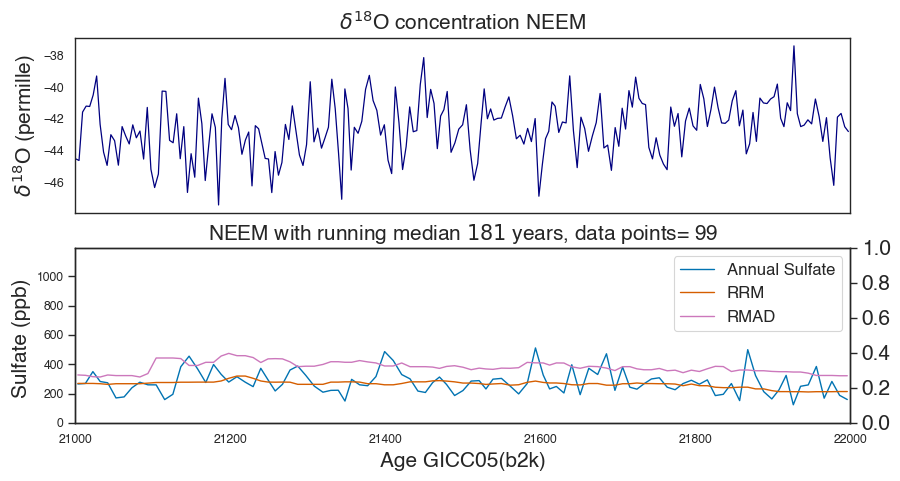

 11%|█         | 12/113 [00:02<00:22,  4.44it/s]

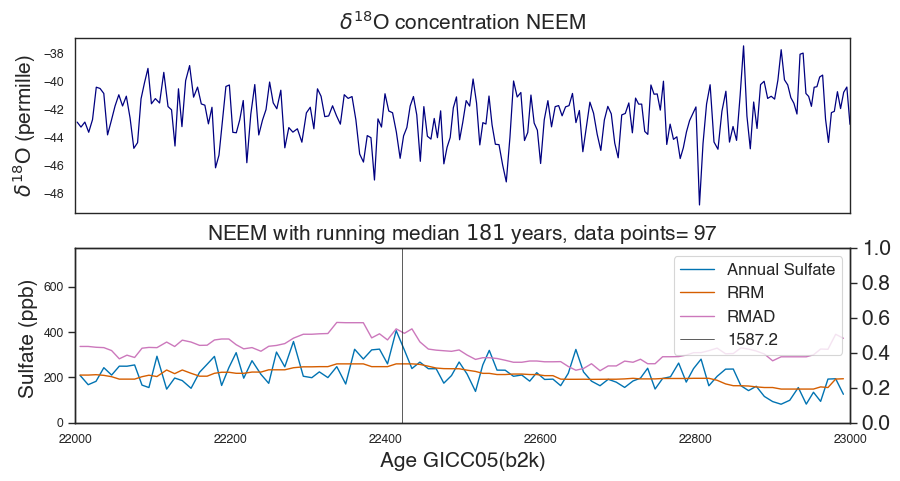

 12%|█▏        | 13/113 [00:03<00:21,  4.62it/s]

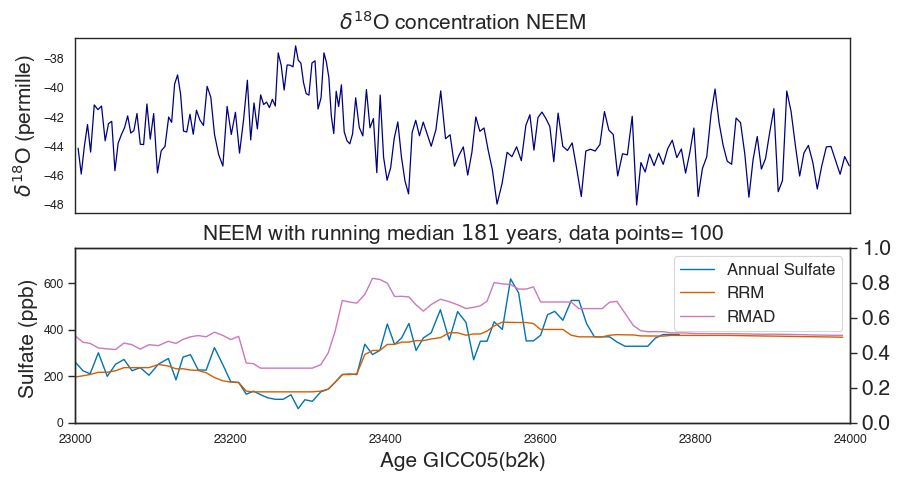

 12%|█▏        | 14/113 [00:03<00:20,  4.85it/s]

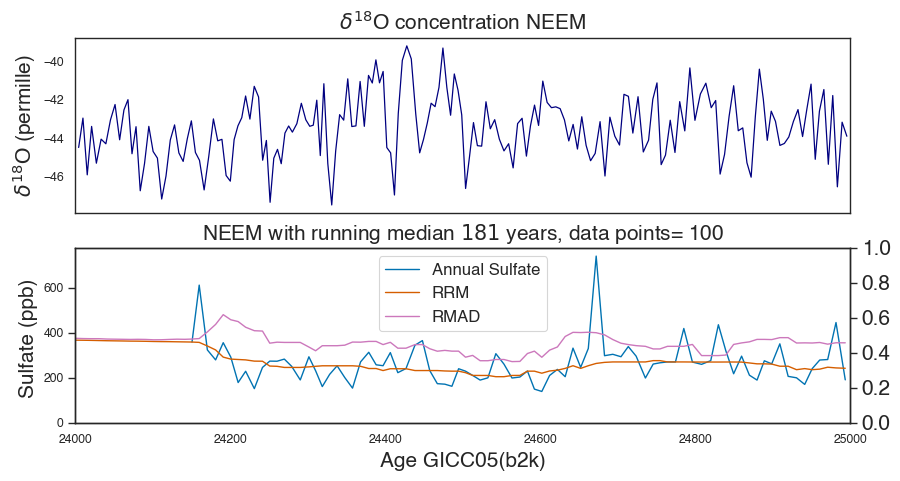

 13%|█▎        | 15/113 [00:03<00:19,  4.99it/s]

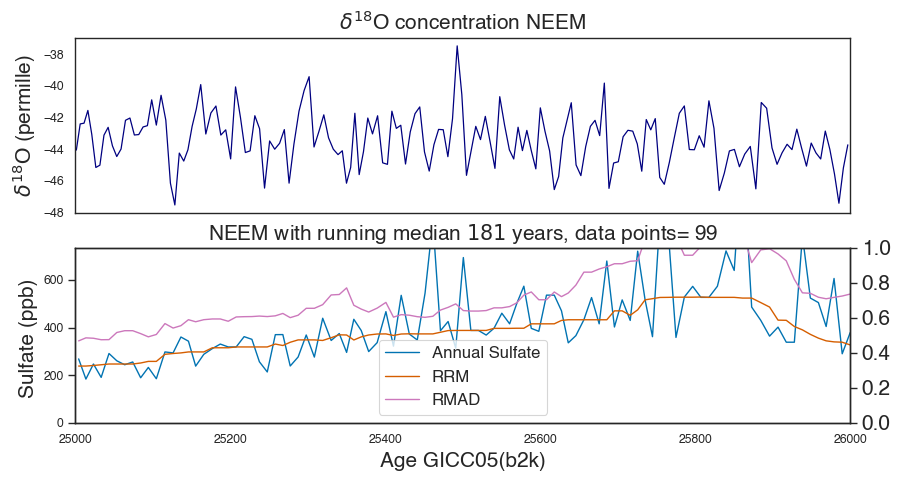

 14%|█▍        | 16/113 [00:03<00:19,  4.93it/s]

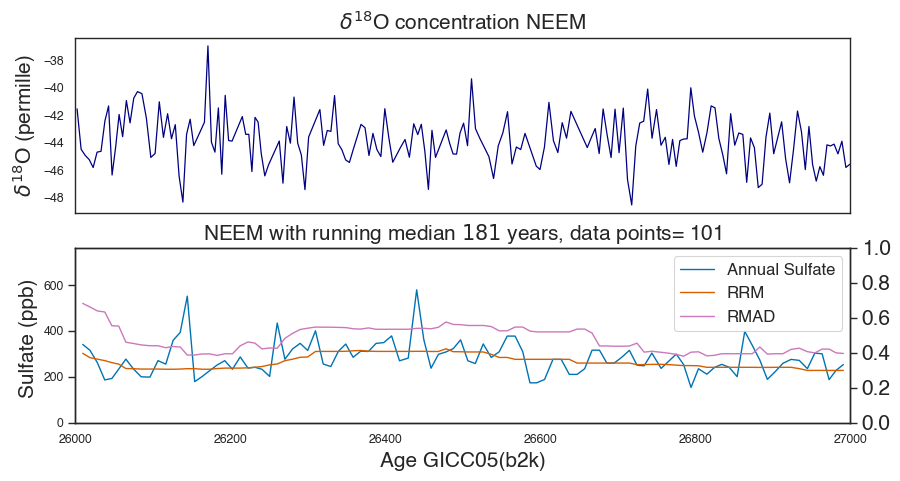

 15%|█▌        | 17/113 [00:03<00:20,  4.79it/s]

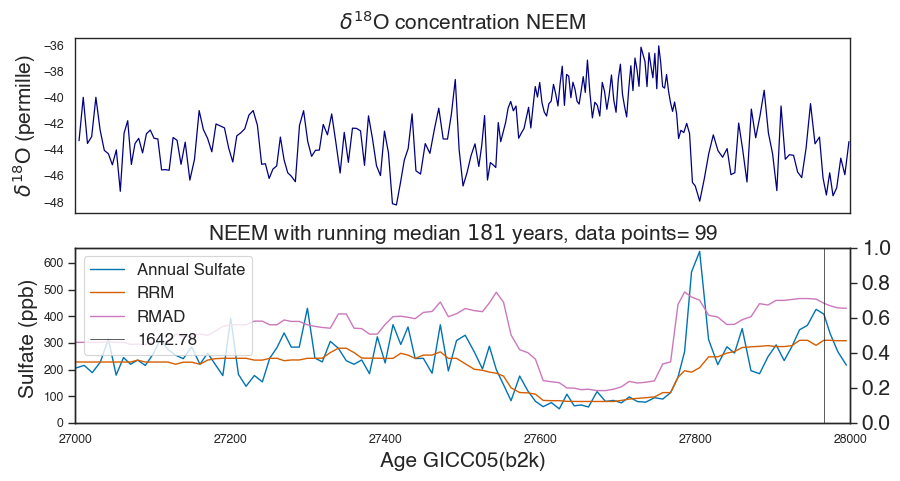

 16%|█▌        | 18/113 [00:04<00:19,  4.81it/s]

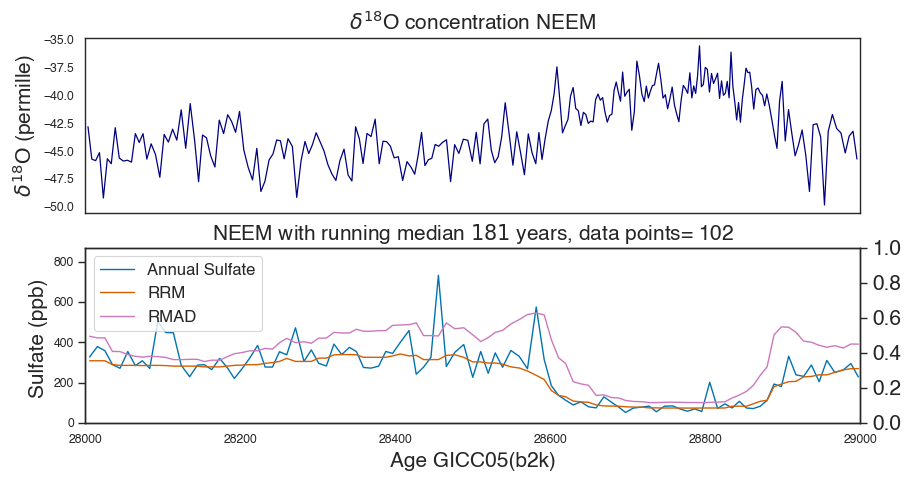

 17%|█▋        | 19/113 [00:04<00:19,  4.89it/s]

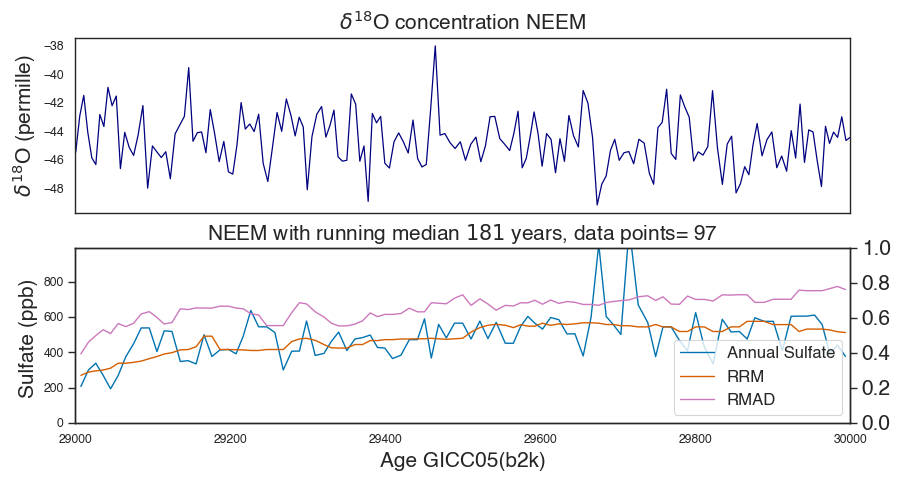

 18%|█▊        | 20/113 [00:04<00:21,  4.42it/s]

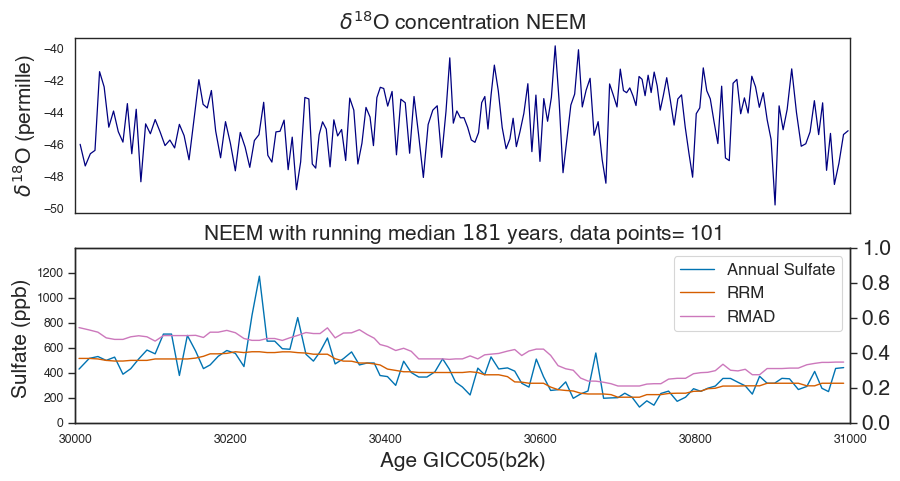

 19%|█▊        | 21/113 [00:04<00:20,  4.55it/s]

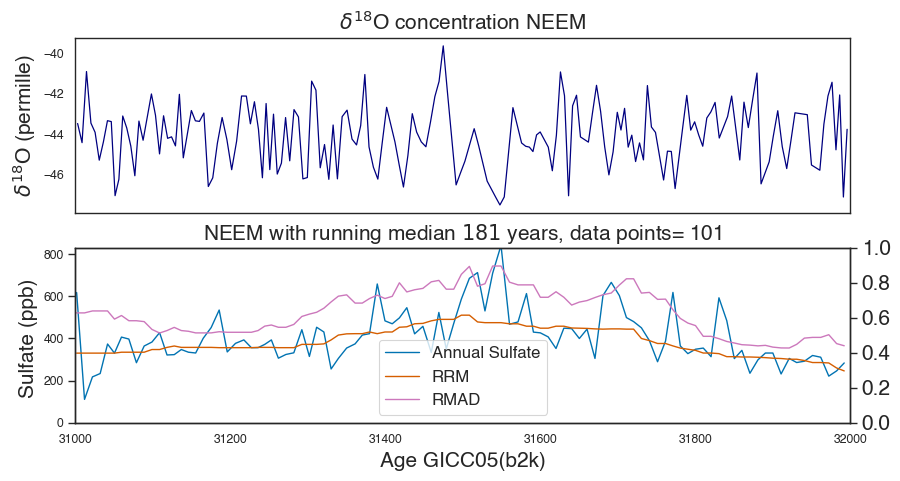

 19%|█▉        | 22/113 [00:05<00:19,  4.73it/s]

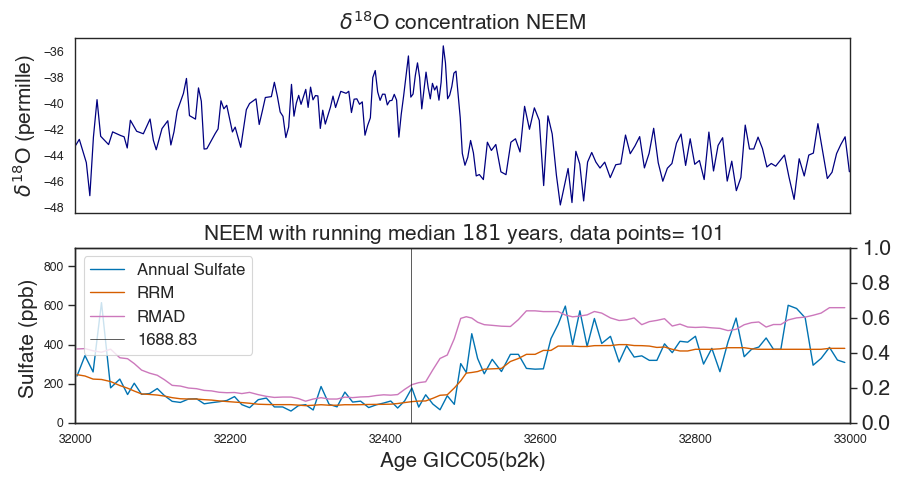

 20%|██        | 23/113 [00:05<00:18,  4.85it/s]

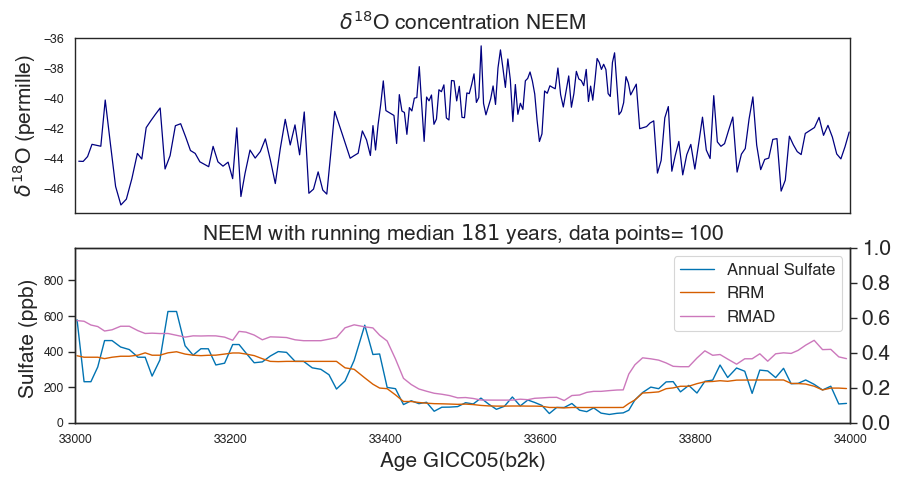

 21%|██        | 24/113 [00:05<00:17,  4.95it/s]

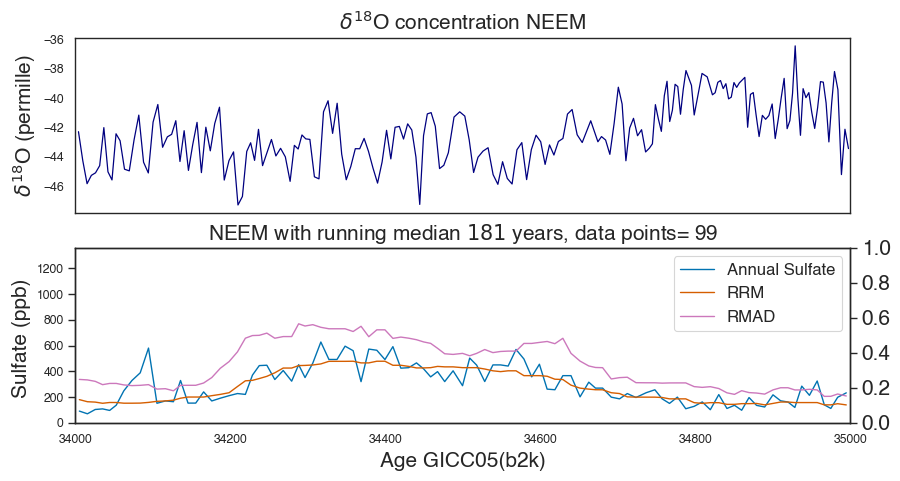

 22%|██▏       | 25/113 [00:05<00:17,  5.03it/s]

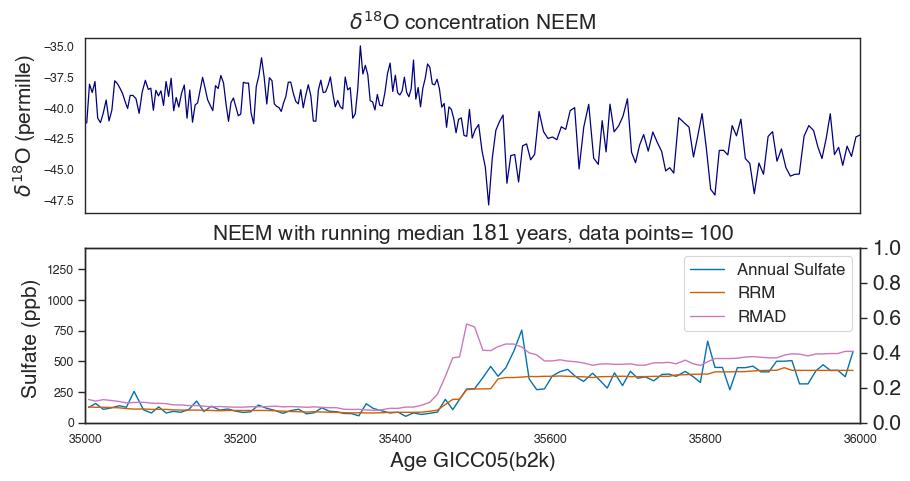

 23%|██▎       | 26/113 [00:05<00:17,  5.05it/s]

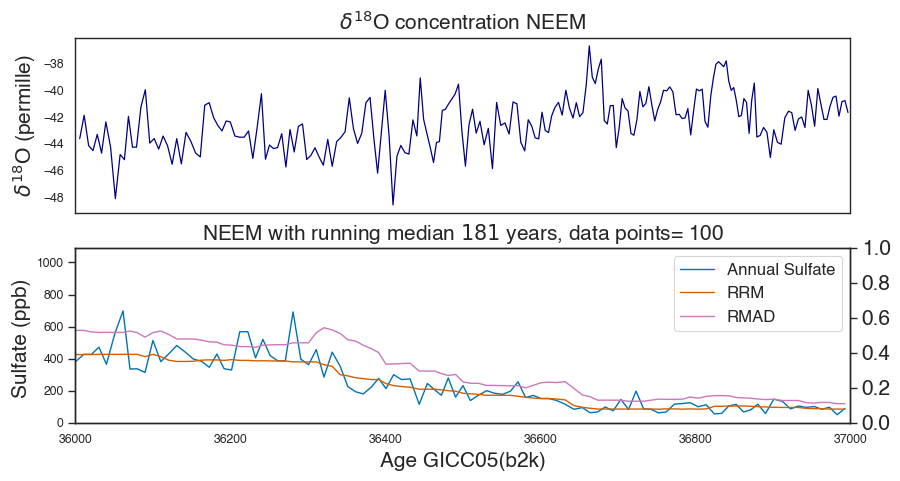

 24%|██▍       | 27/113 [00:05<00:17,  5.04it/s]

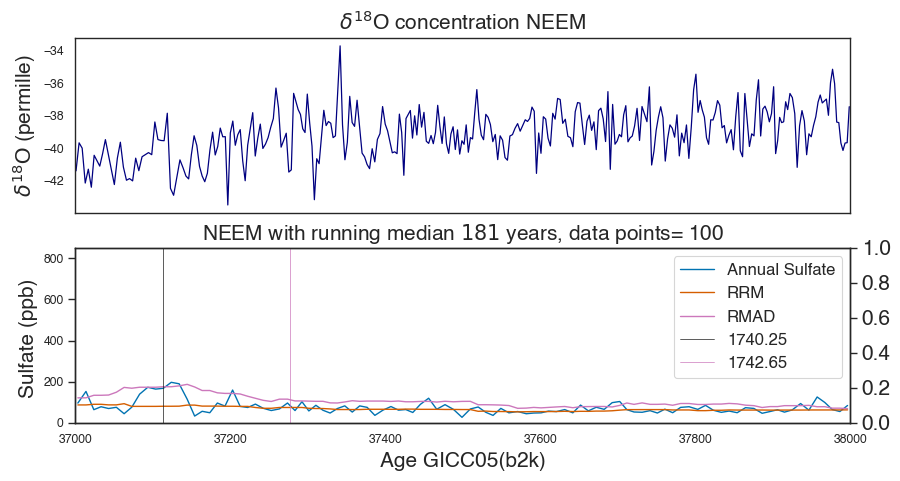

 25%|██▍       | 28/113 [00:06<00:18,  4.55it/s]

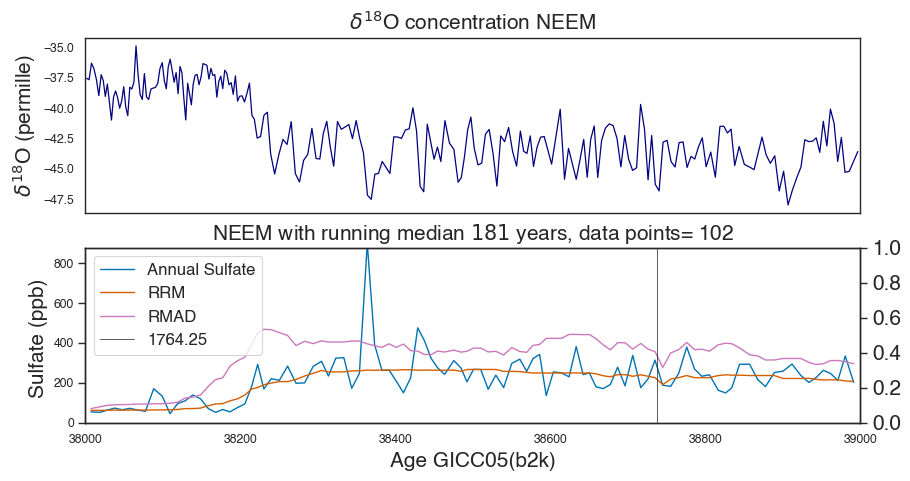

 26%|██▌       | 29/113 [00:06<00:18,  4.66it/s]

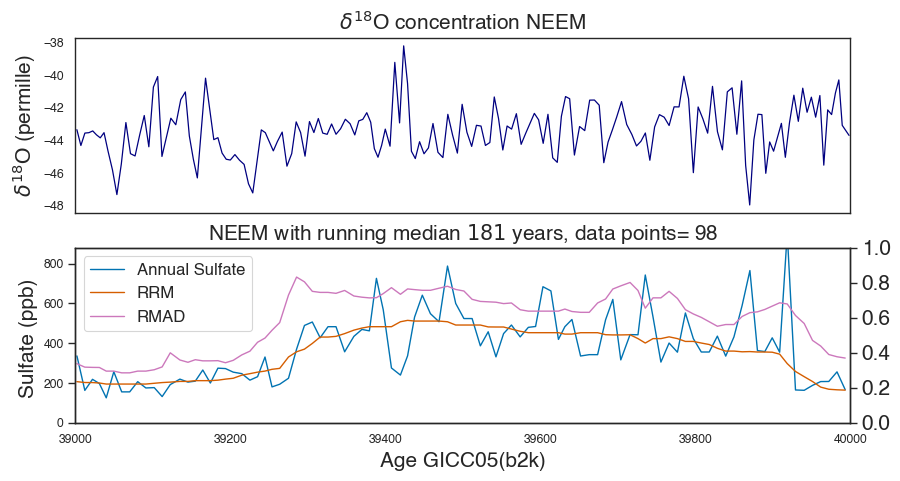

 27%|██▋       | 30/113 [00:06<00:17,  4.80it/s]

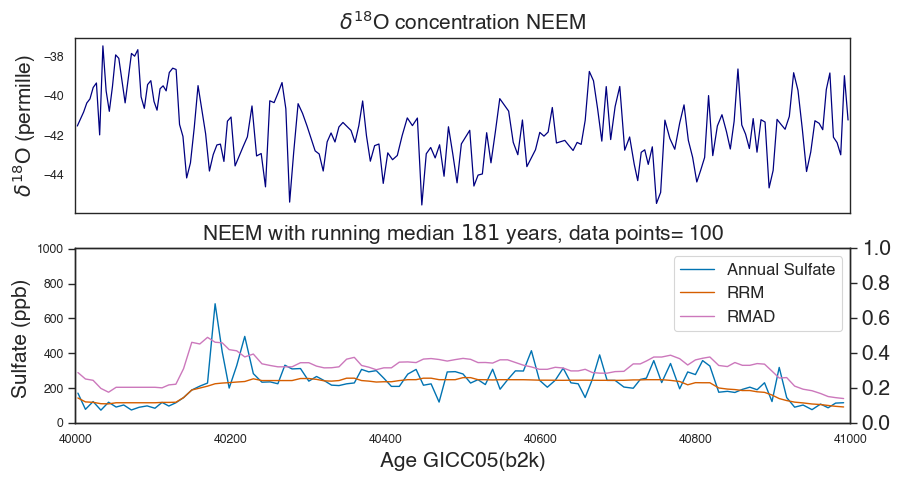

 27%|██▋       | 31/113 [00:06<00:16,  4.88it/s]

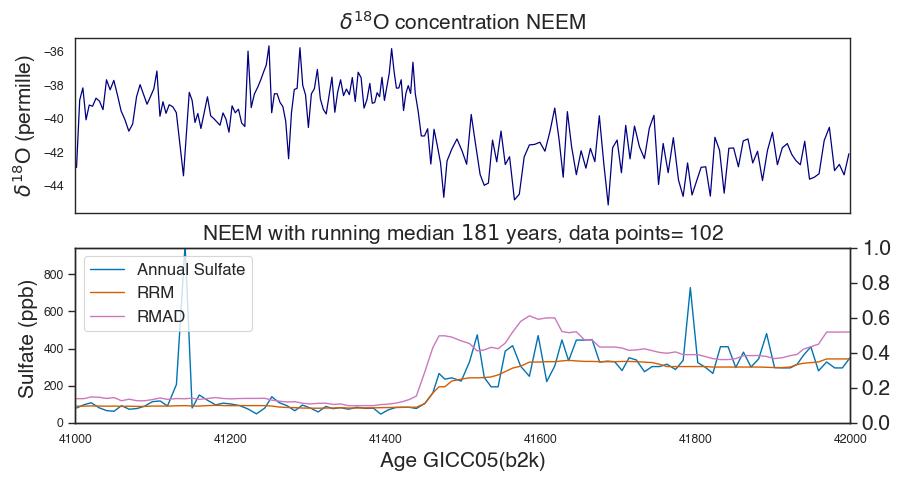

 28%|██▊       | 32/113 [00:07<00:16,  5.00it/s]

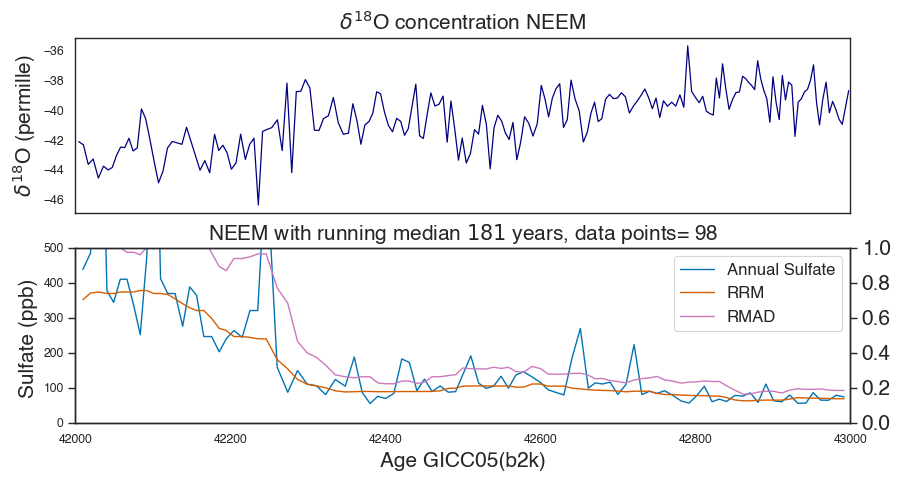

 29%|██▉       | 33/113 [00:07<00:15,  5.09it/s]

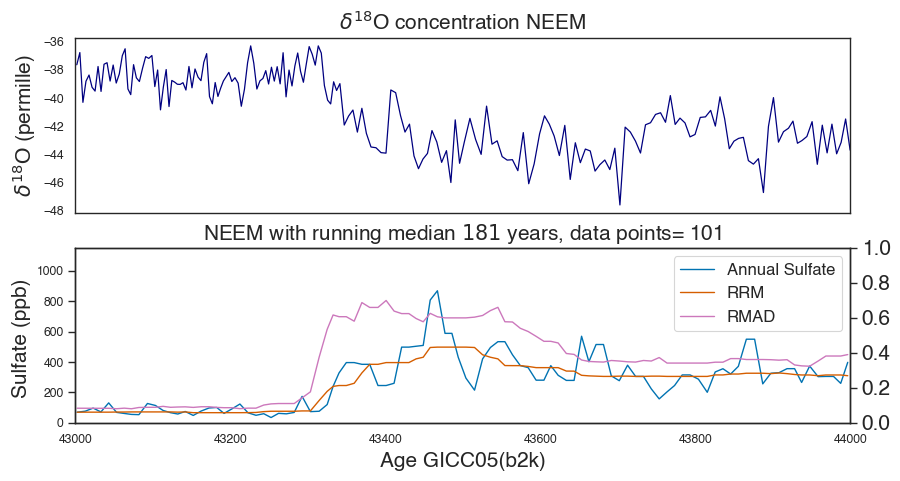

 30%|███       | 34/113 [00:07<00:15,  5.07it/s]

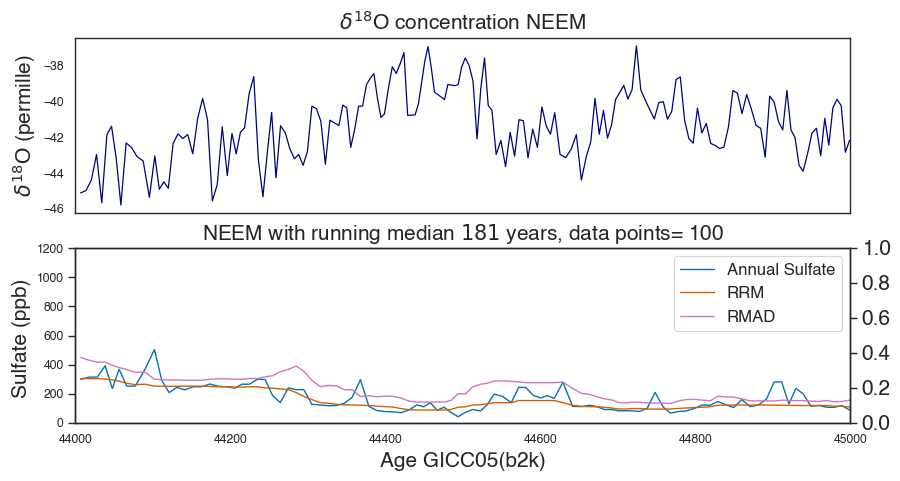

 31%|███       | 35/113 [00:07<00:15,  5.01it/s]

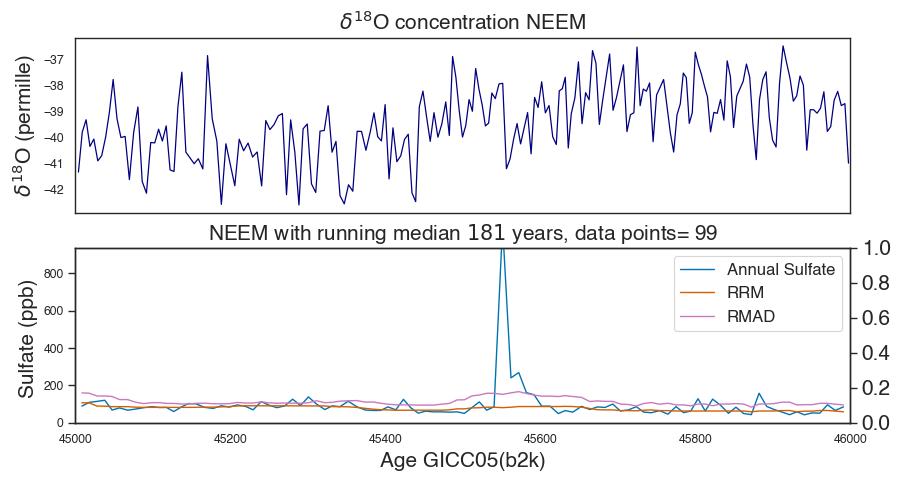

 32%|███▏      | 36/113 [00:07<00:16,  4.58it/s]

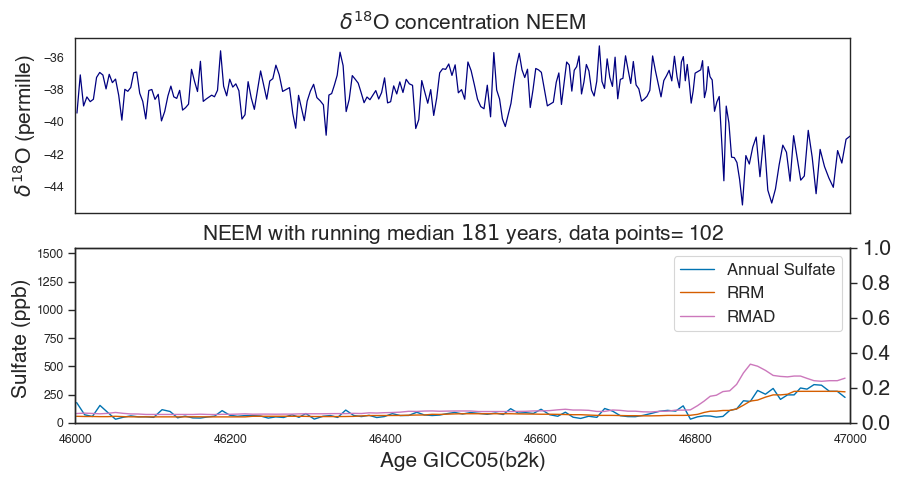

 33%|███▎      | 37/113 [00:08<00:15,  4.80it/s]

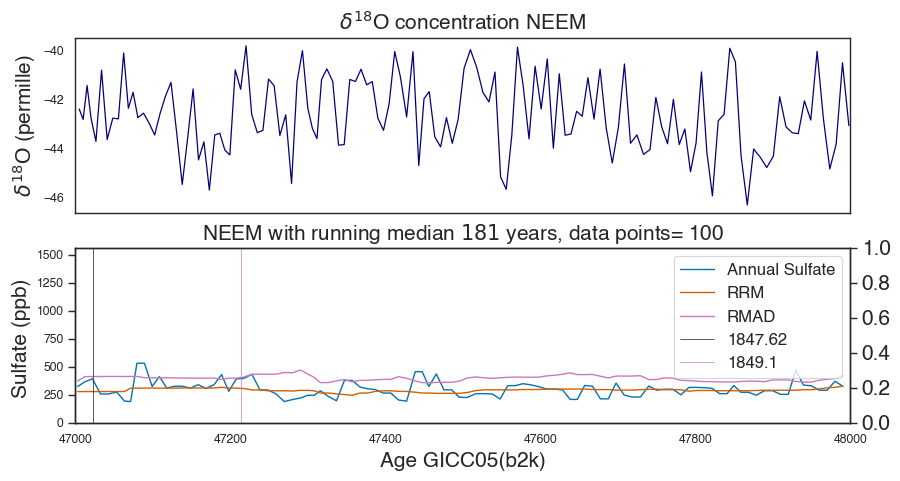

 34%|███▎      | 38/113 [00:08<00:15,  4.72it/s]

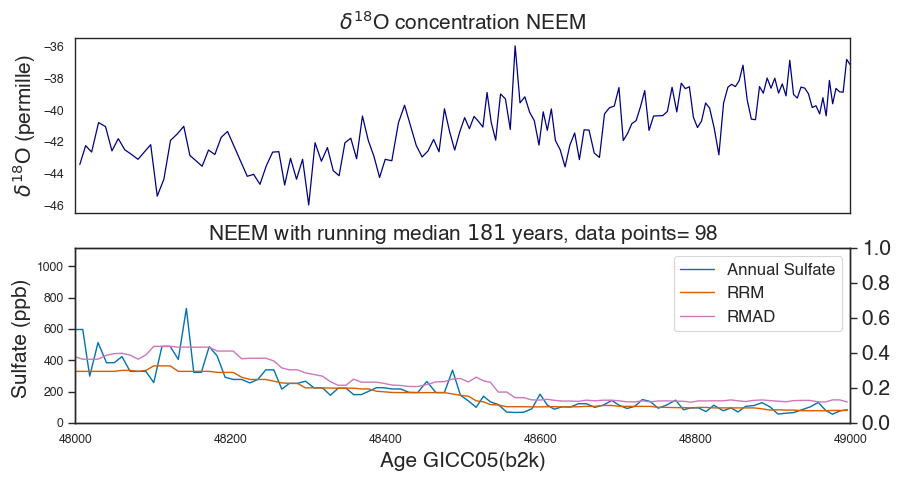

 35%|███▍      | 39/113 [00:08<00:15,  4.90it/s]

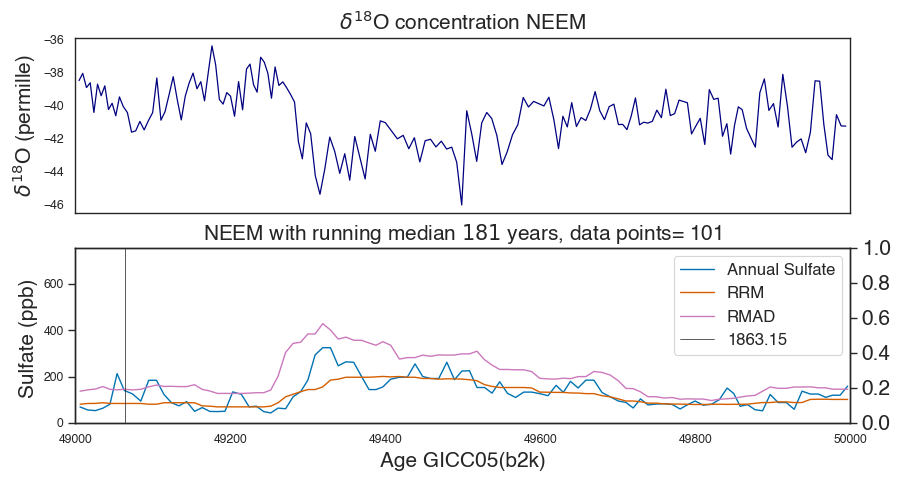

 35%|███▌      | 40/113 [00:08<00:14,  5.01it/s]

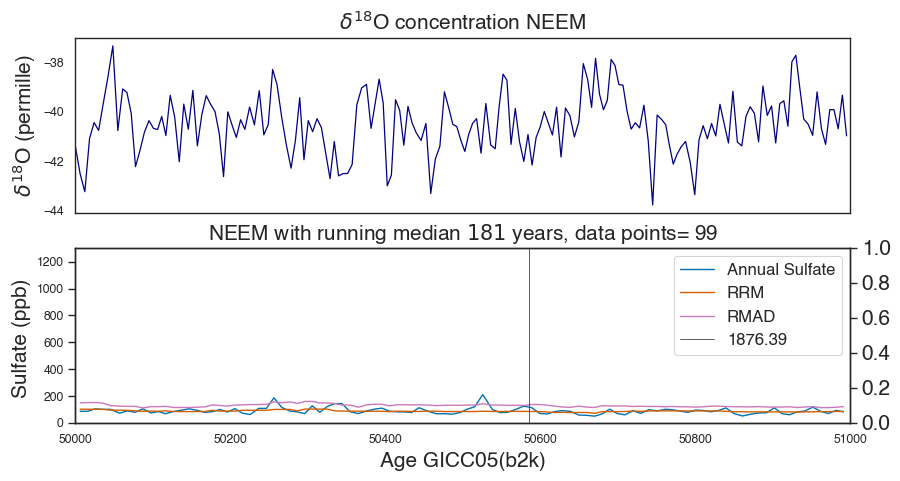

 36%|███▋      | 41/113 [00:08<00:14,  4.90it/s]

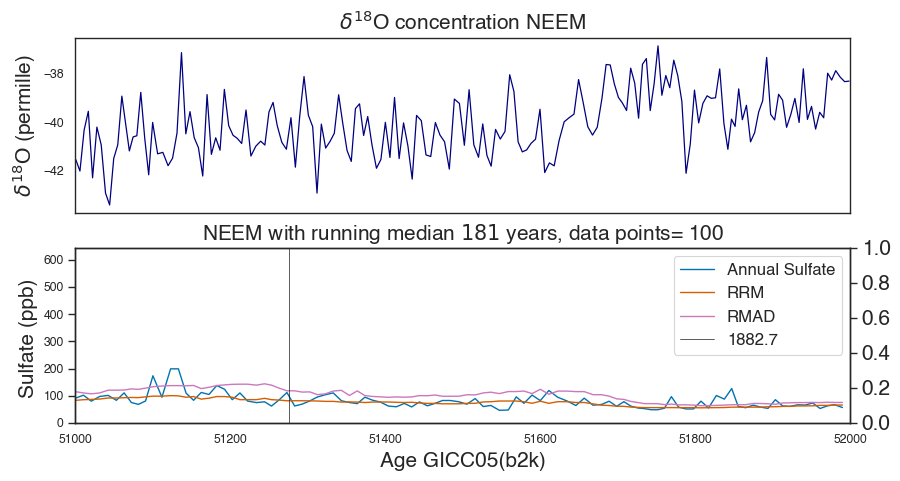

 37%|███▋      | 42/113 [00:09<00:14,  5.03it/s]

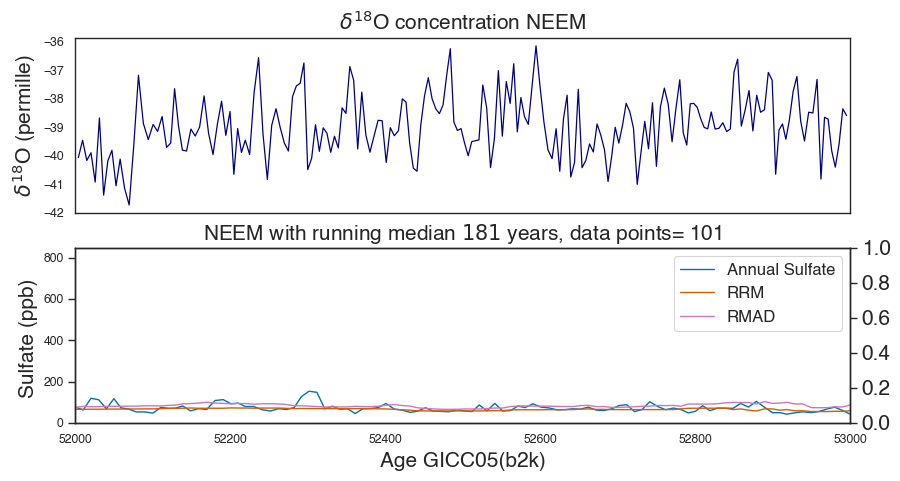

 38%|███▊      | 43/113 [00:09<00:13,  5.05it/s]

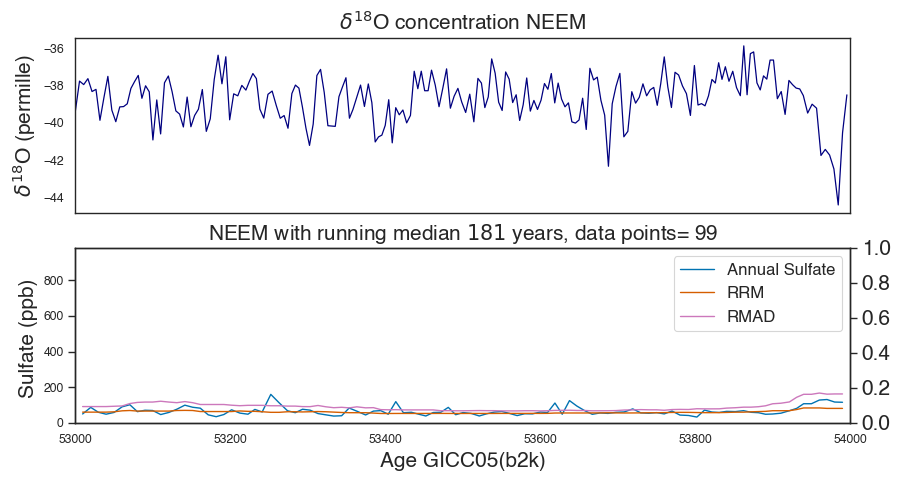

 39%|███▉      | 44/113 [00:09<00:14,  4.62it/s]

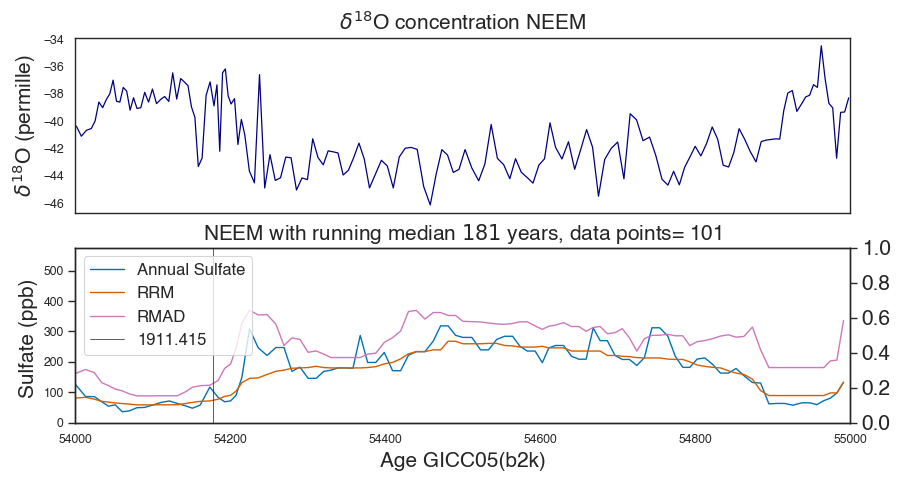

 40%|███▉      | 45/113 [00:09<00:14,  4.58it/s]

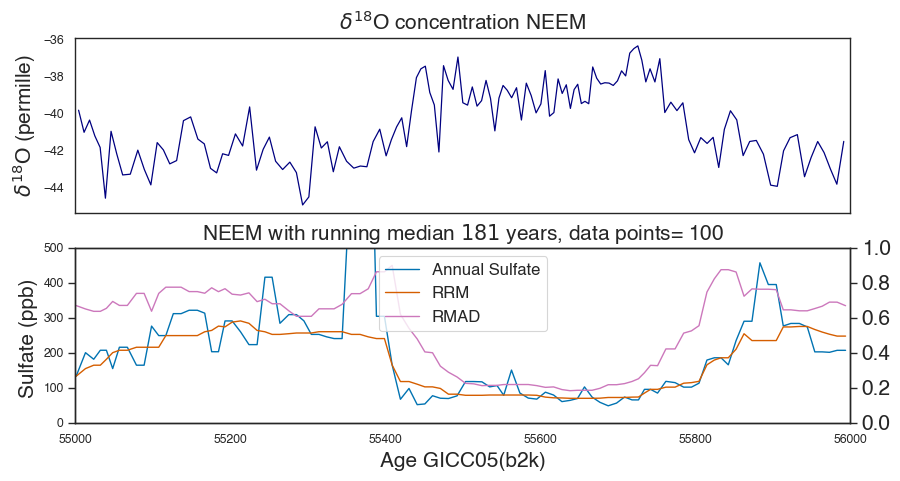

 41%|████      | 46/113 [00:09<00:14,  4.76it/s]

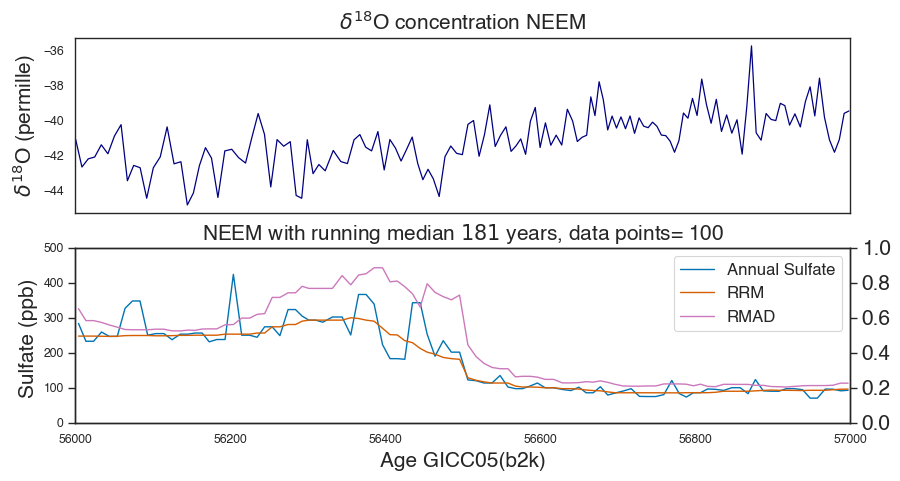

 42%|████▏     | 47/113 [00:10<00:13,  4.94it/s]

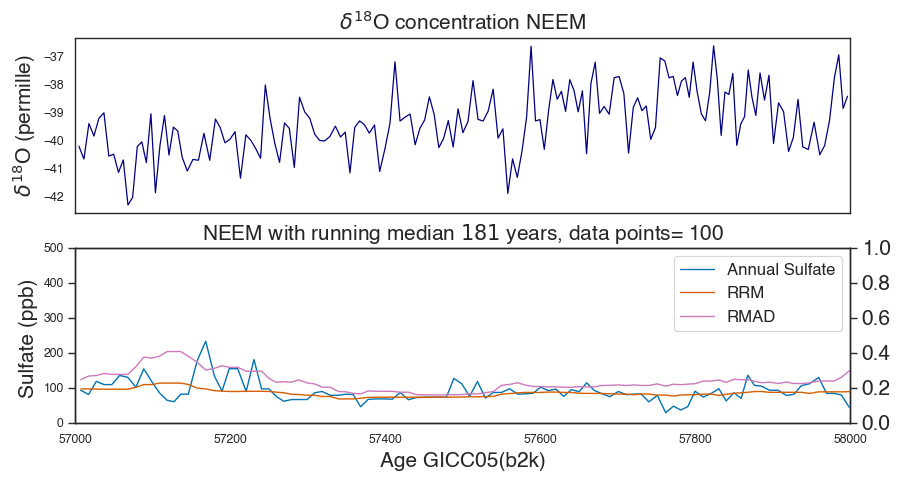

 42%|████▏     | 48/113 [00:10<00:13,  4.91it/s]

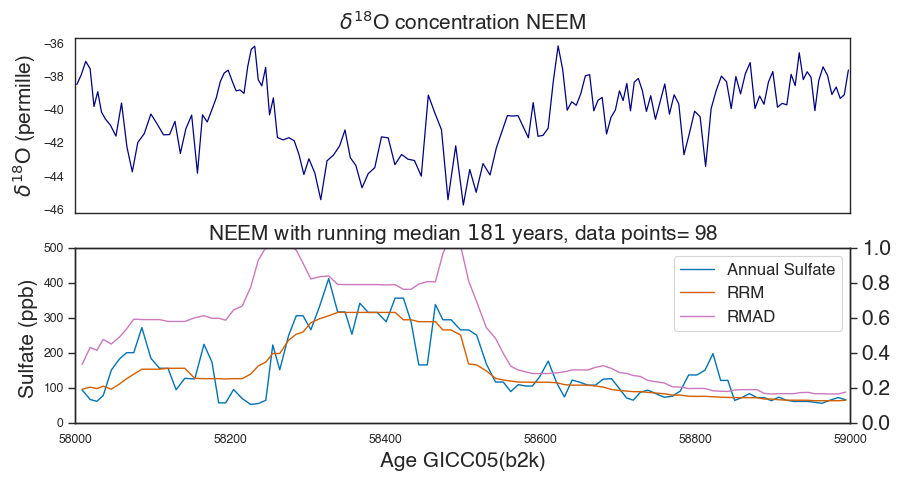

 43%|████▎     | 49/113 [00:10<00:12,  4.93it/s]

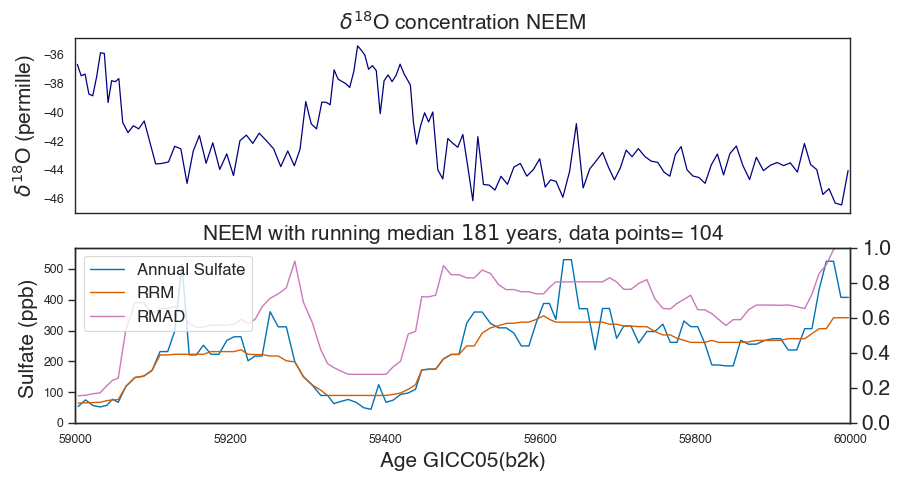

 44%|████▍     | 50/113 [00:10<00:12,  4.98it/s]

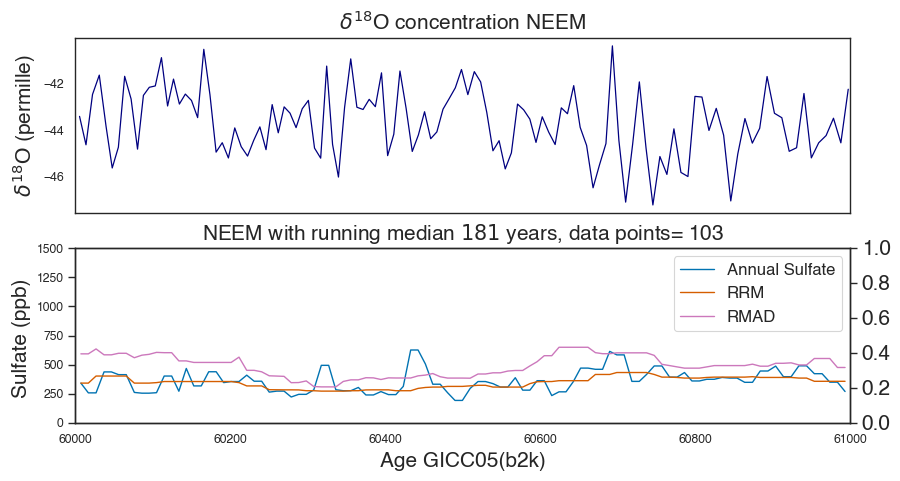

 45%|████▌     | 51/113 [00:10<00:12,  5.00it/s]

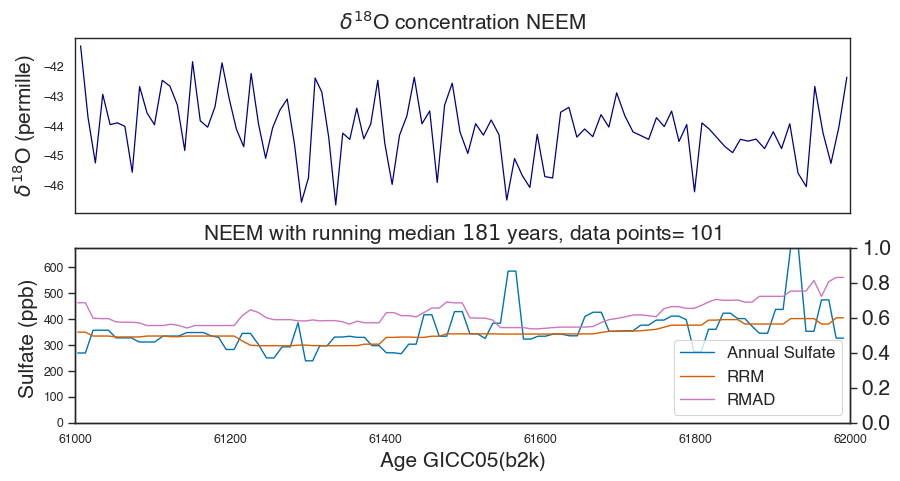

 46%|████▌     | 52/113 [00:11<00:13,  4.49it/s]

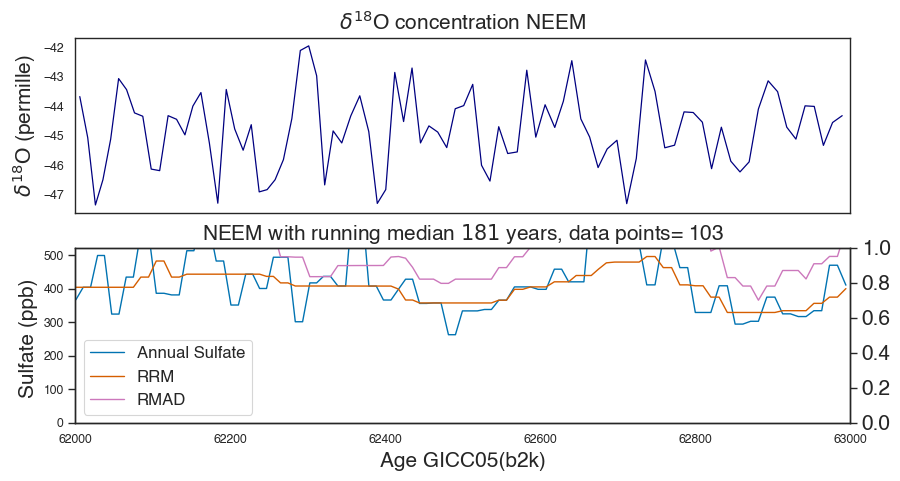

 47%|████▋     | 53/113 [00:11<00:12,  4.72it/s]

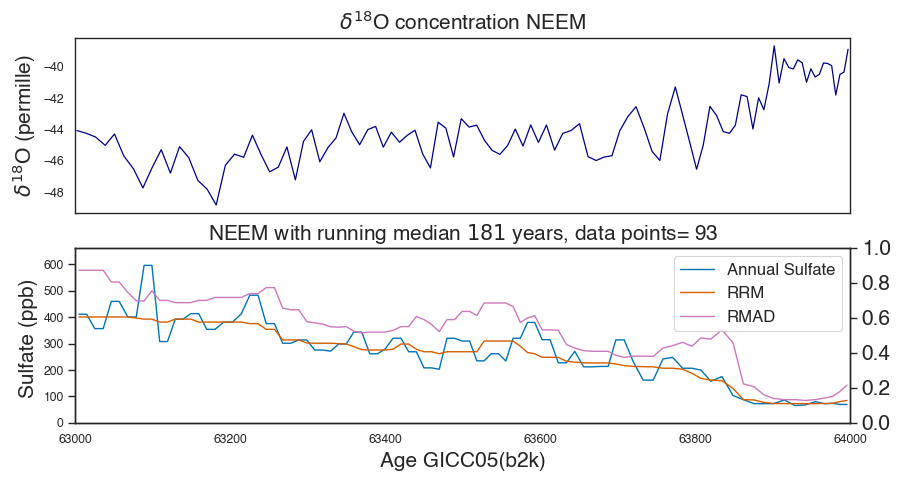

 48%|████▊     | 54/113 [00:11<00:12,  4.73it/s]

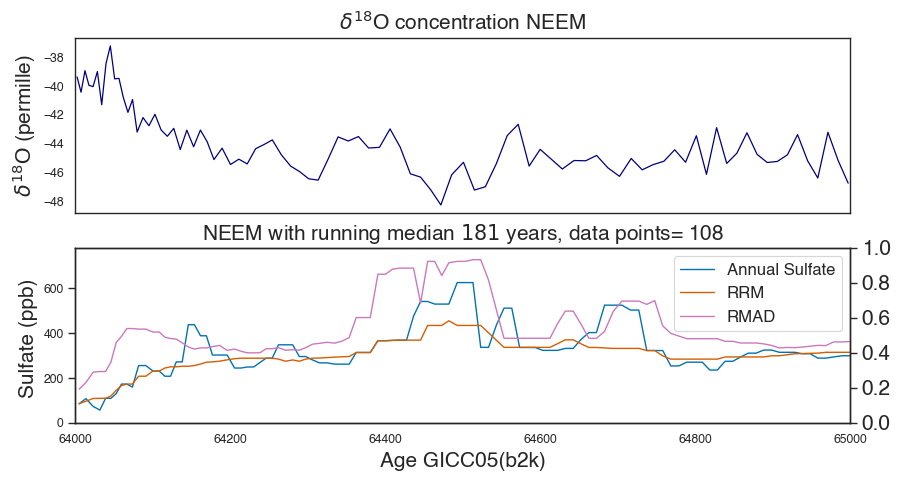

 49%|████▊     | 55/113 [00:11<00:11,  4.87it/s]

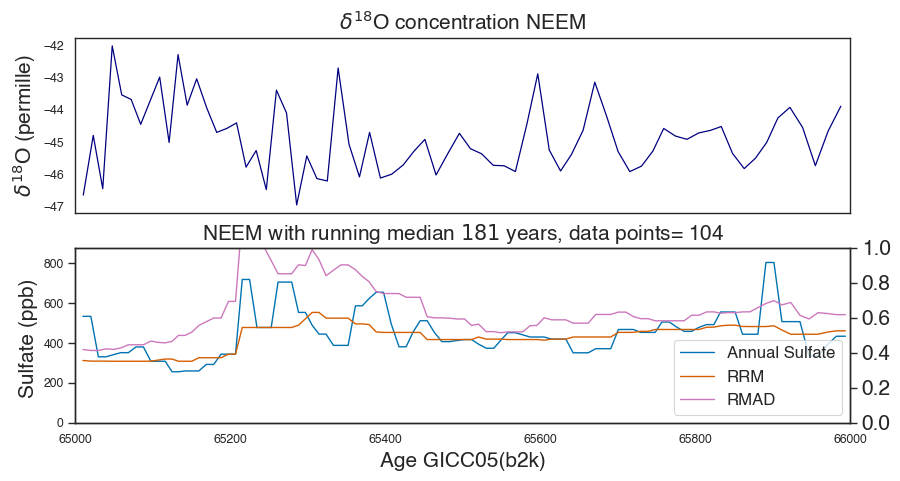

 50%|████▉     | 56/113 [00:12<00:11,  4.82it/s]

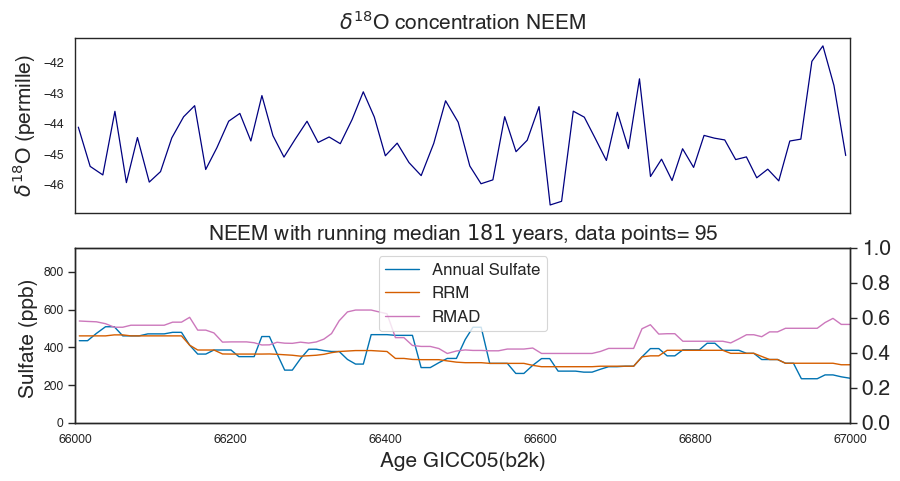

 50%|█████     | 57/113 [00:12<00:11,  4.92it/s]

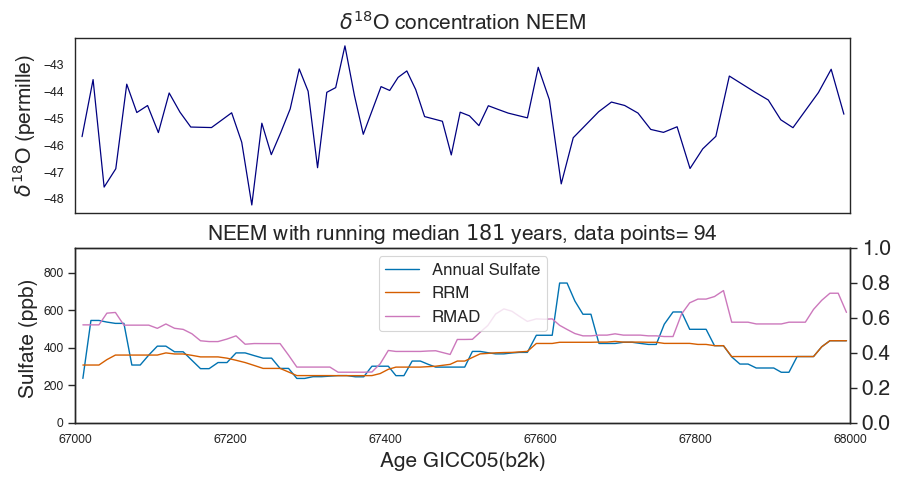

 51%|█████▏    | 58/113 [00:12<00:11,  4.79it/s]

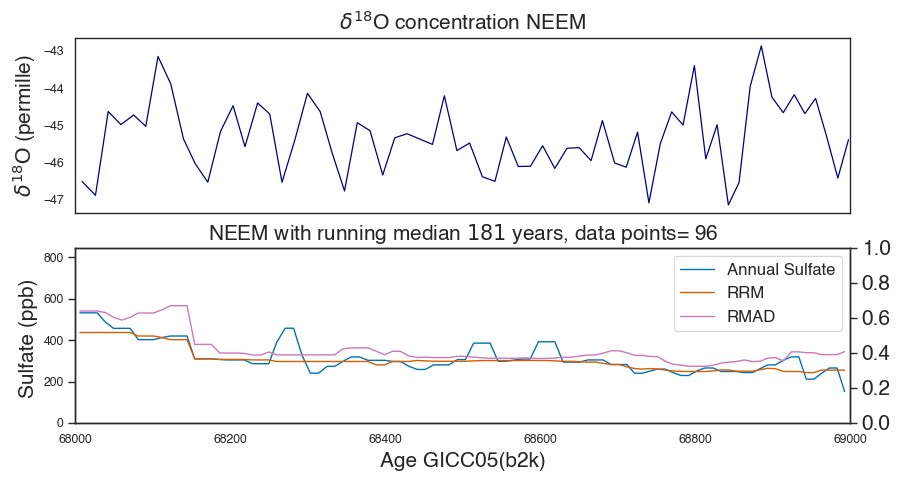

 52%|█████▏    | 59/113 [00:12<00:10,  4.92it/s]

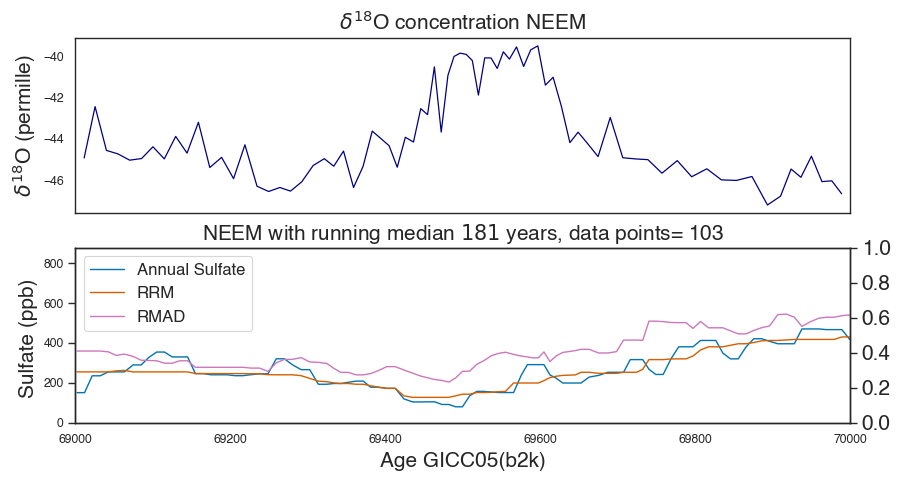

 53%|█████▎    | 60/113 [00:12<00:11,  4.46it/s]

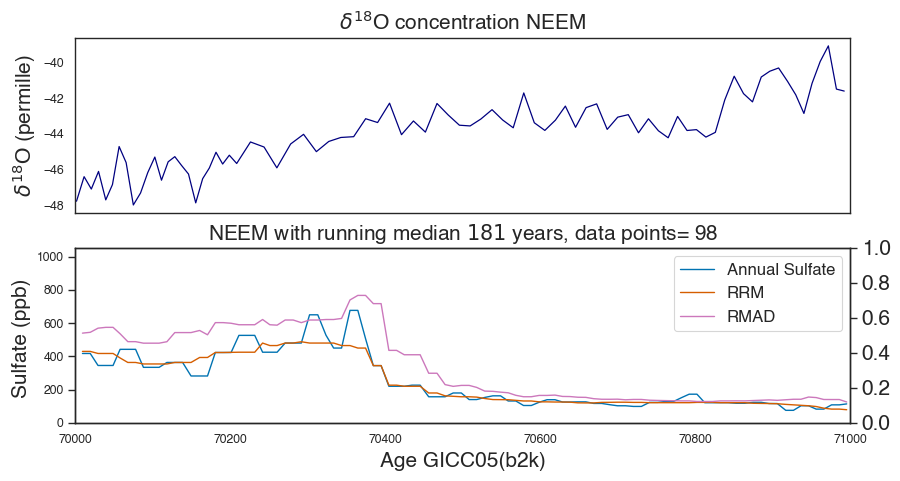

 54%|█████▍    | 61/113 [00:13<00:11,  4.68it/s]

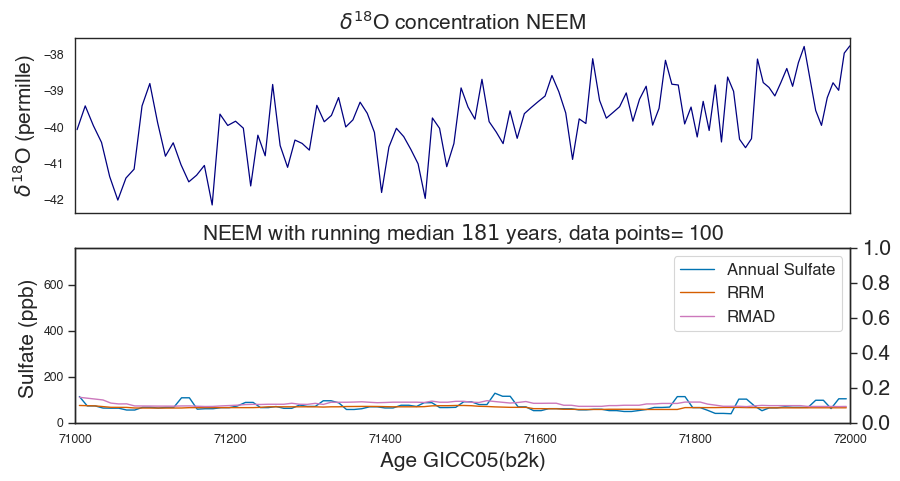

 55%|█████▍    | 62/113 [00:13<00:10,  4.76it/s]

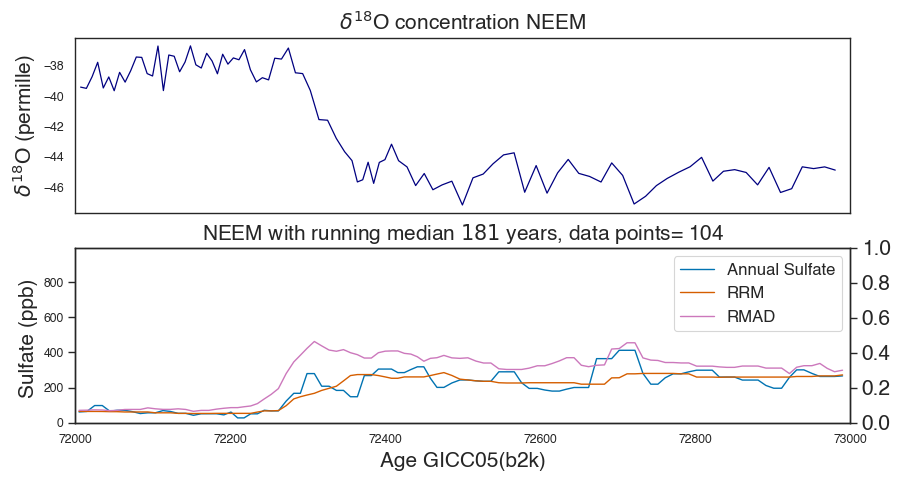

 56%|█████▌    | 63/113 [00:13<00:10,  4.97it/s]

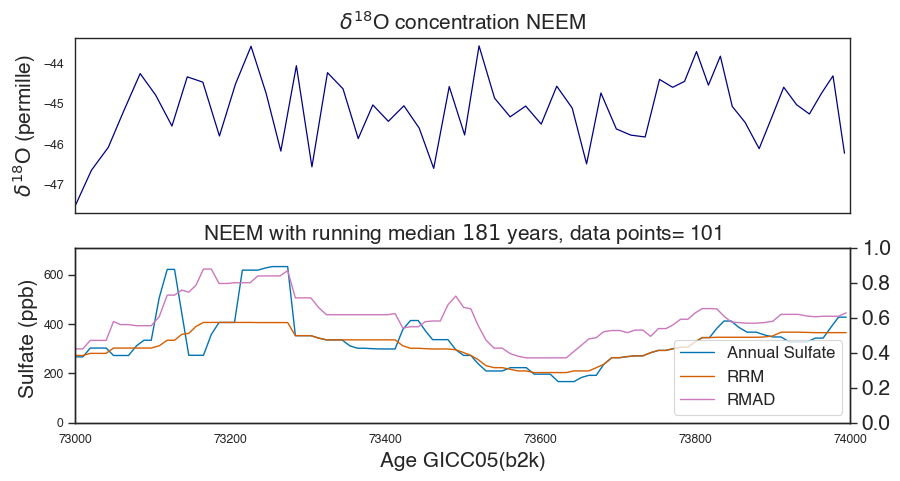

 57%|█████▋    | 64/113 [00:13<00:09,  4.99it/s]

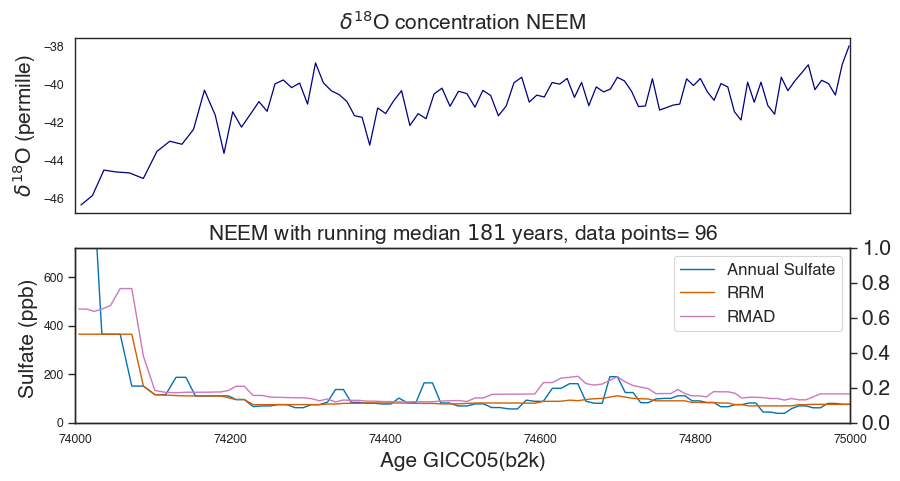

 58%|█████▊    | 65/113 [00:13<00:09,  5.08it/s]

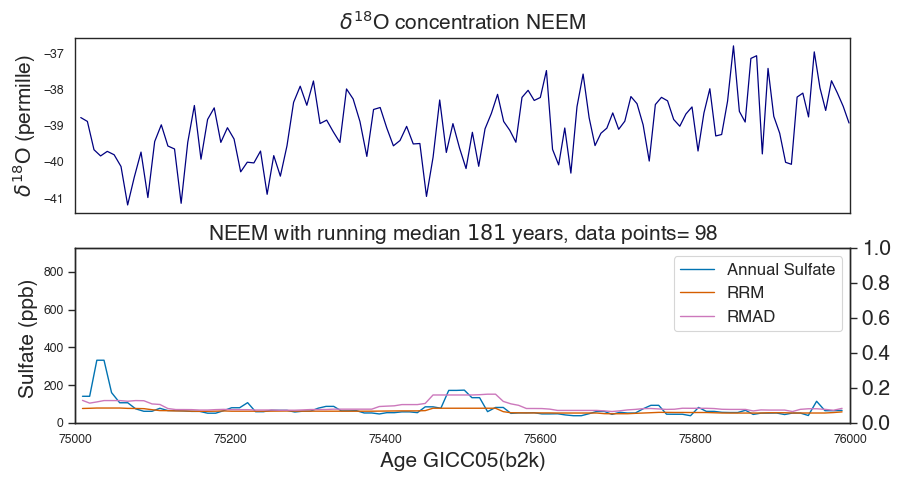

 58%|█████▊    | 66/113 [00:14<00:09,  5.09it/s]

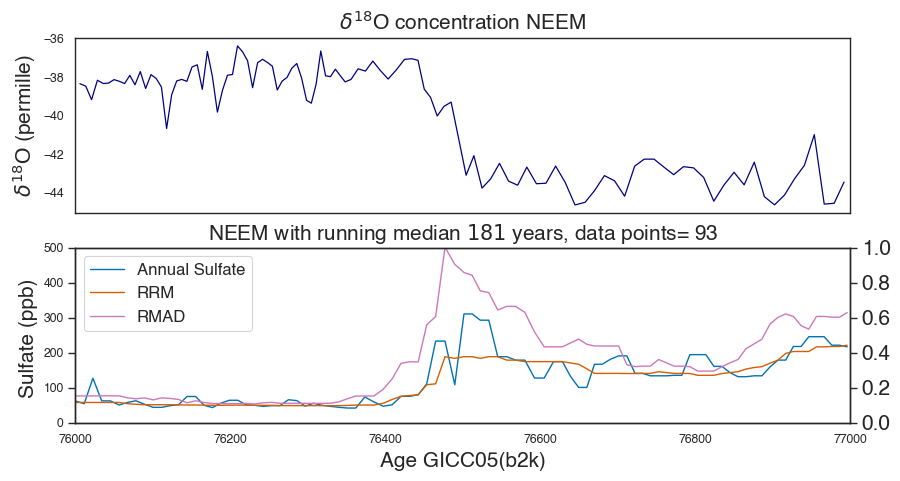

 59%|█████▉    | 67/113 [00:14<00:08,  5.16it/s]

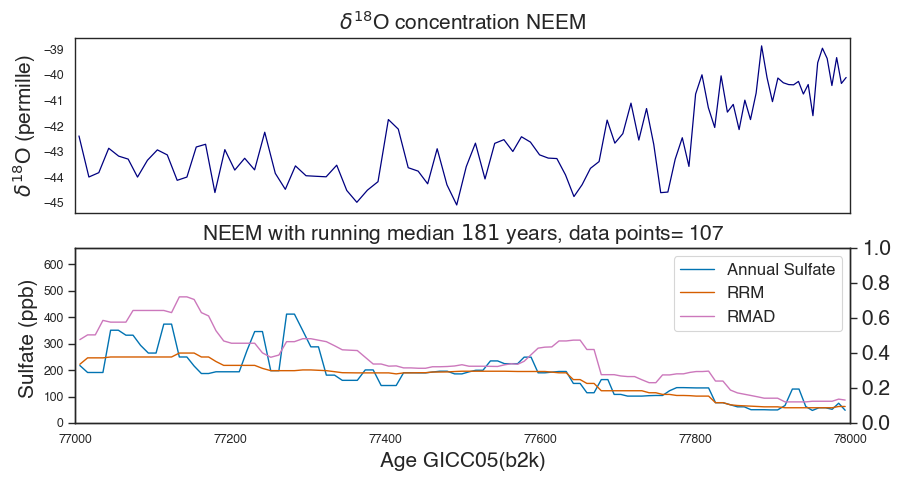

 60%|██████    | 68/113 [00:14<00:09,  4.51it/s]

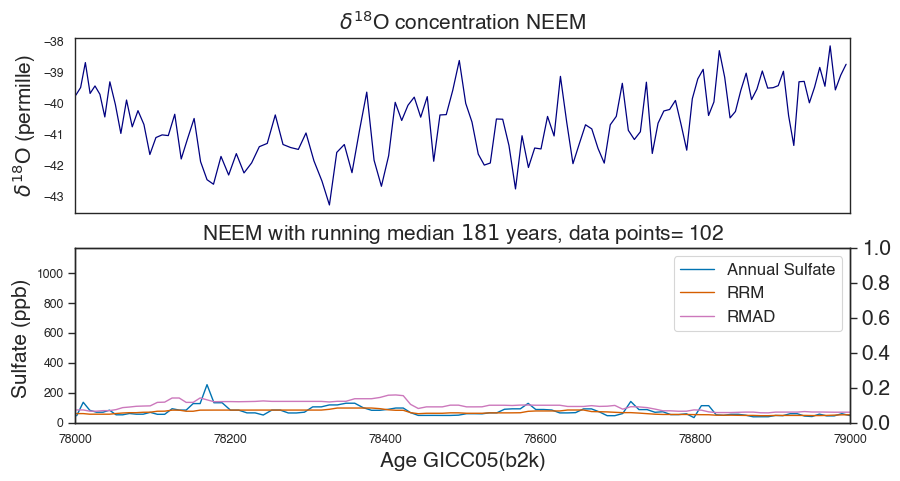

 61%|██████    | 69/113 [00:14<00:09,  4.73it/s]

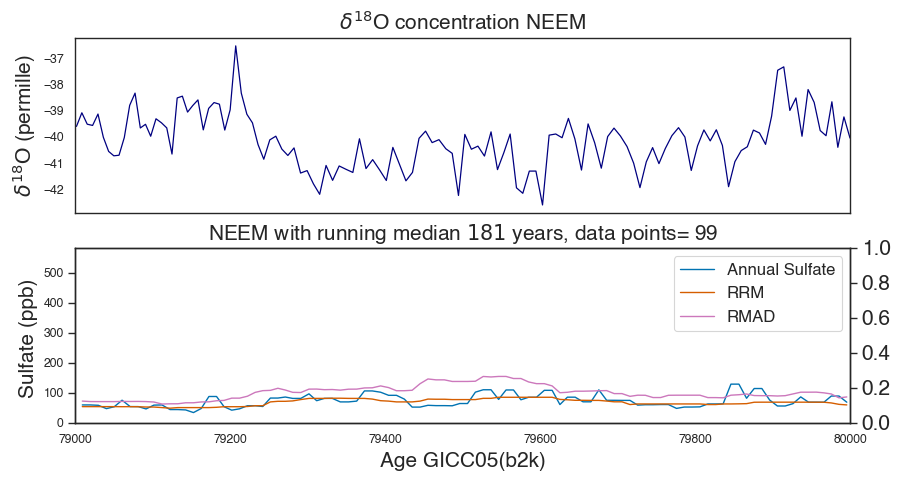

 62%|██████▏   | 70/113 [00:14<00:09,  4.77it/s]

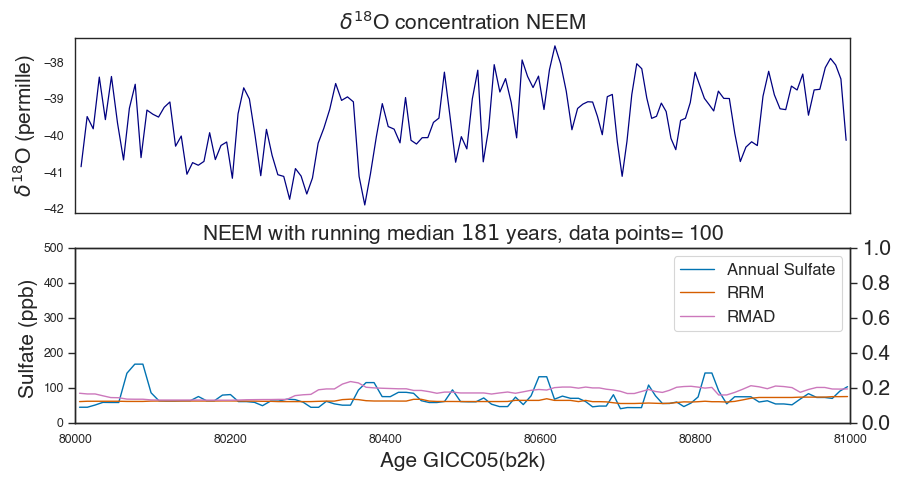

 63%|██████▎   | 71/113 [00:15<00:08,  4.88it/s]

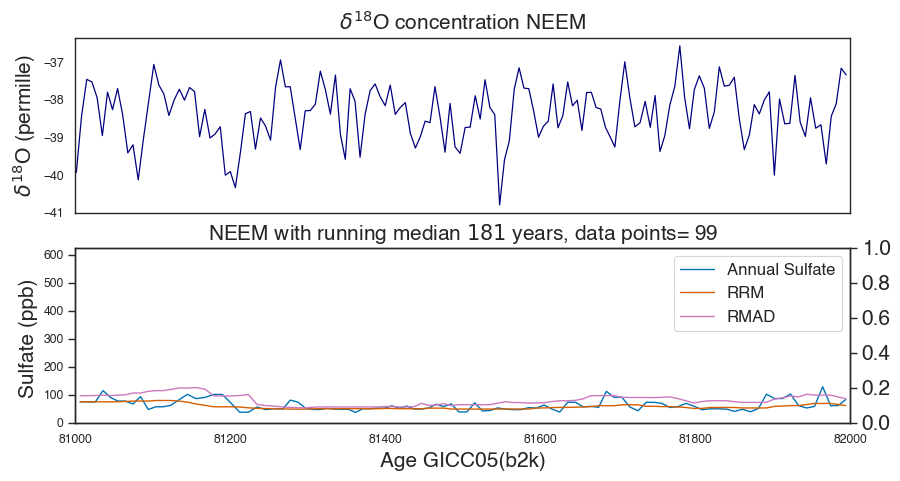

 64%|██████▎   | 72/113 [00:15<00:08,  4.72it/s]

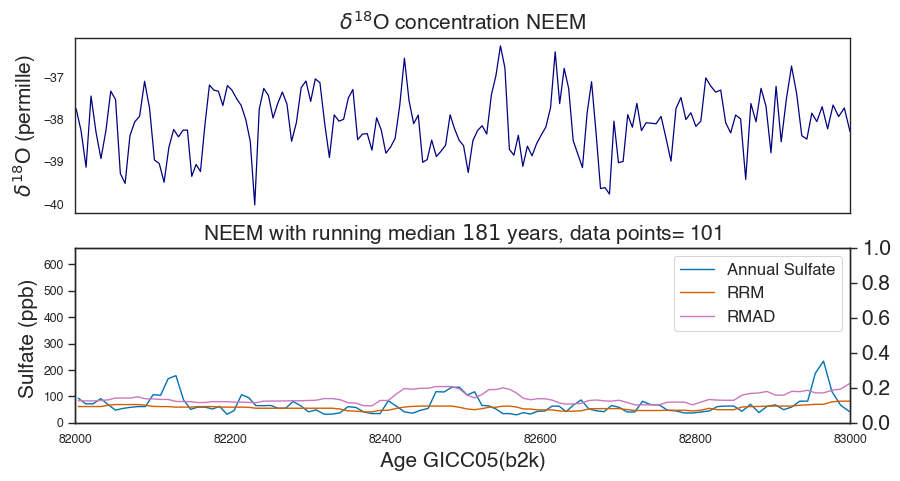

 65%|██████▍   | 73/113 [00:15<00:08,  4.89it/s]

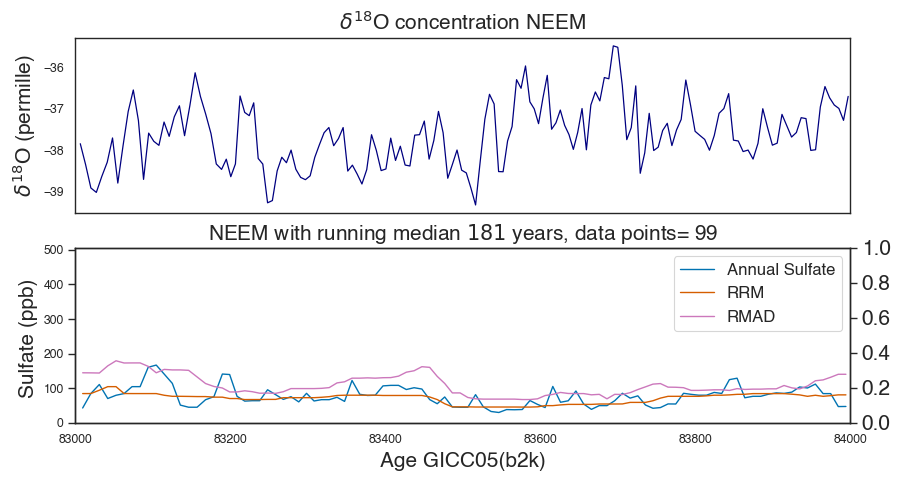

 65%|██████▌   | 74/113 [00:15<00:07,  4.93it/s]

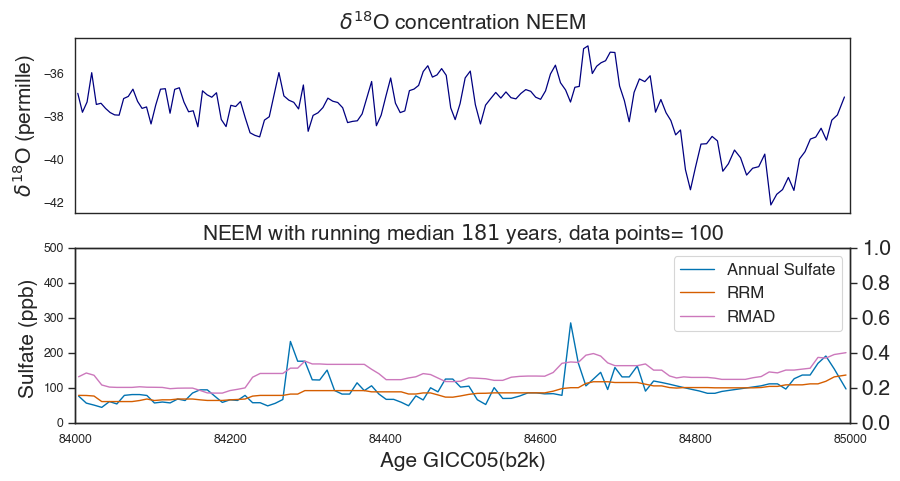

 66%|██████▋   | 75/113 [00:15<00:07,  5.09it/s]

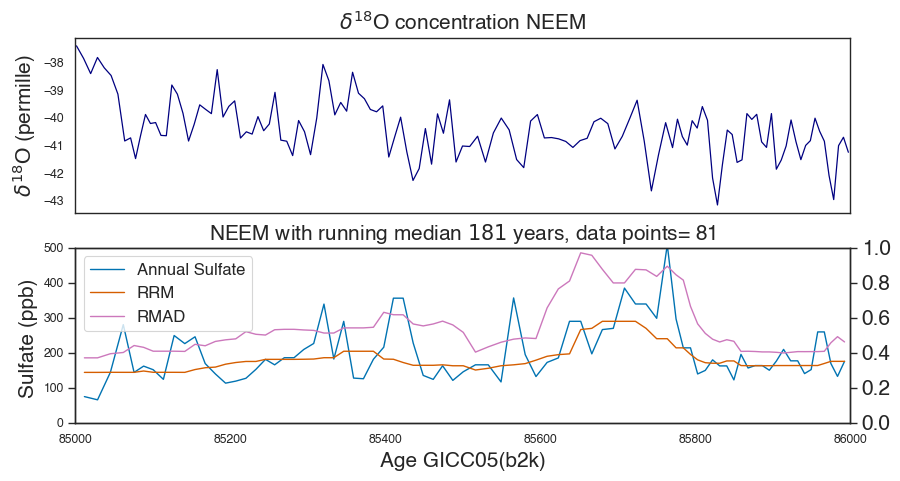

 67%|██████▋   | 76/113 [00:16<00:08,  4.50it/s]

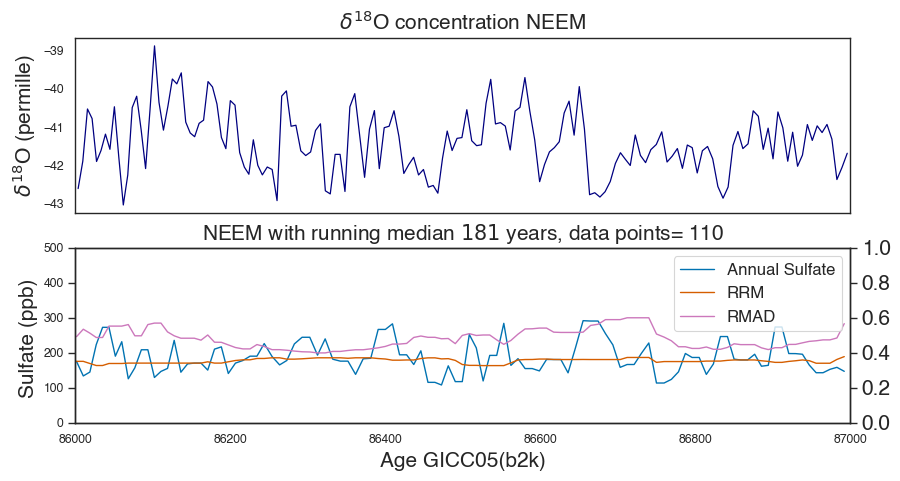

 68%|██████▊   | 77/113 [00:16<00:07,  4.66it/s]

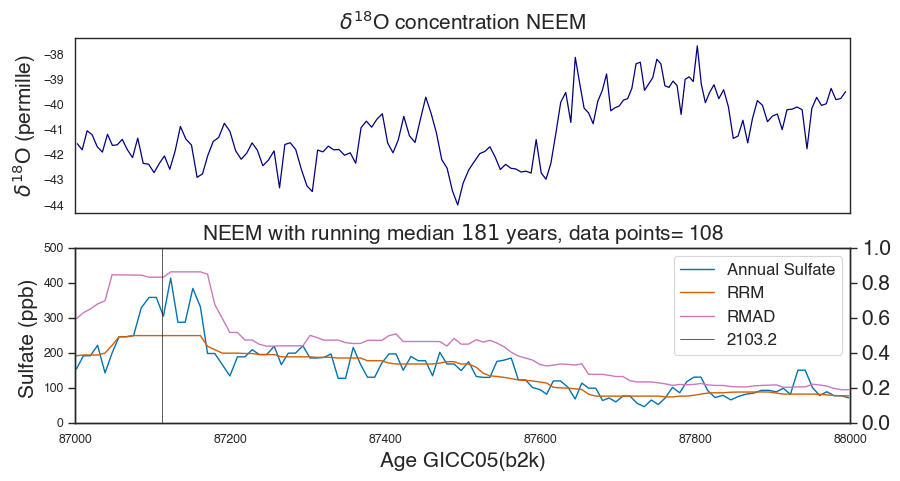

 69%|██████▉   | 78/113 [00:16<00:07,  4.75it/s]

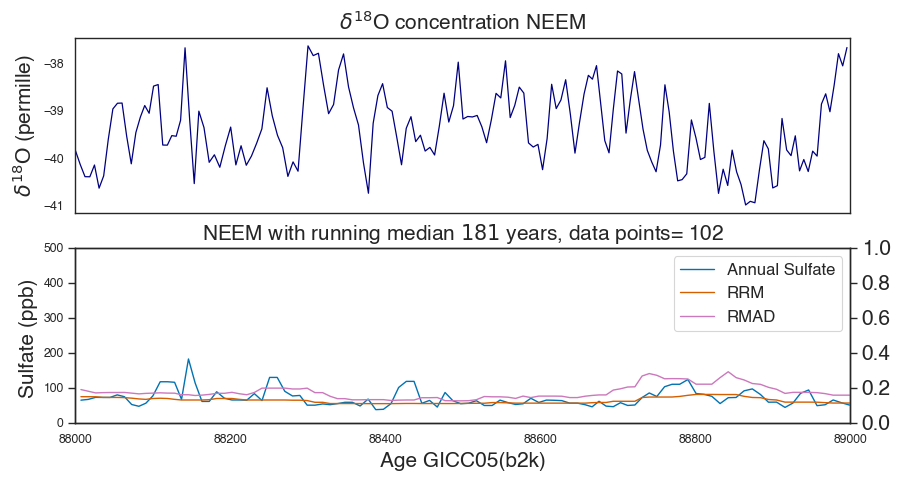

 70%|██████▉   | 79/113 [00:16<00:07,  4.64it/s]

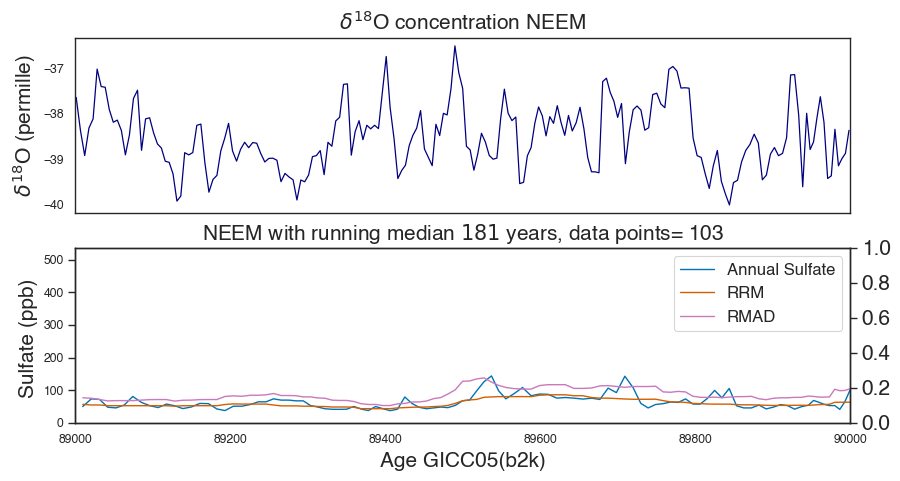

 71%|███████   | 80/113 [00:17<00:06,  4.76it/s]

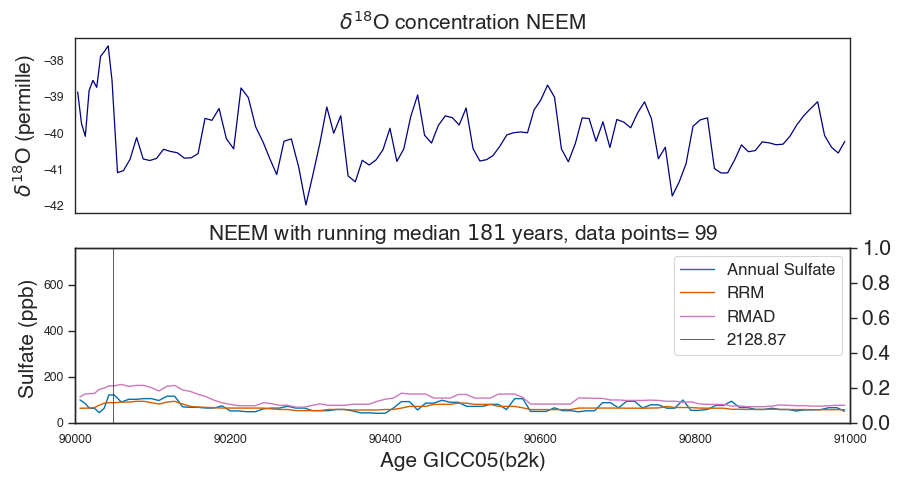

 72%|███████▏  | 81/113 [00:17<00:06,  4.80it/s]

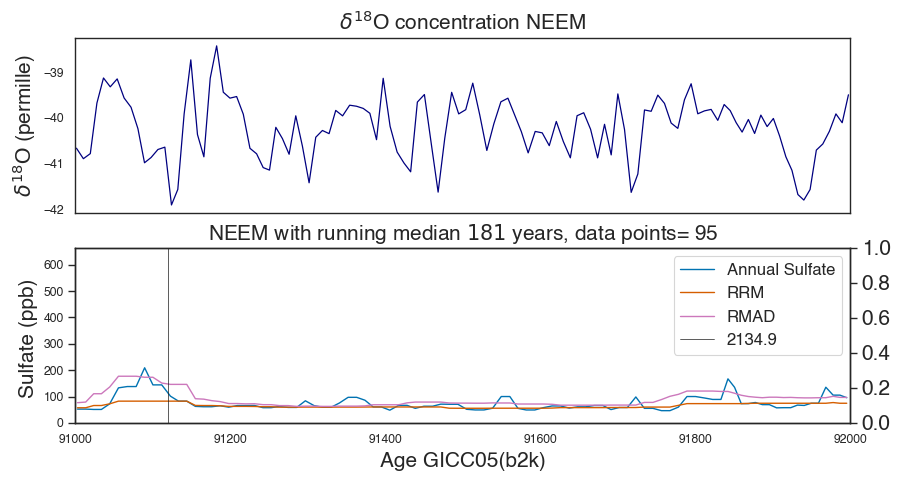

 73%|███████▎  | 82/113 [00:17<00:06,  4.92it/s]

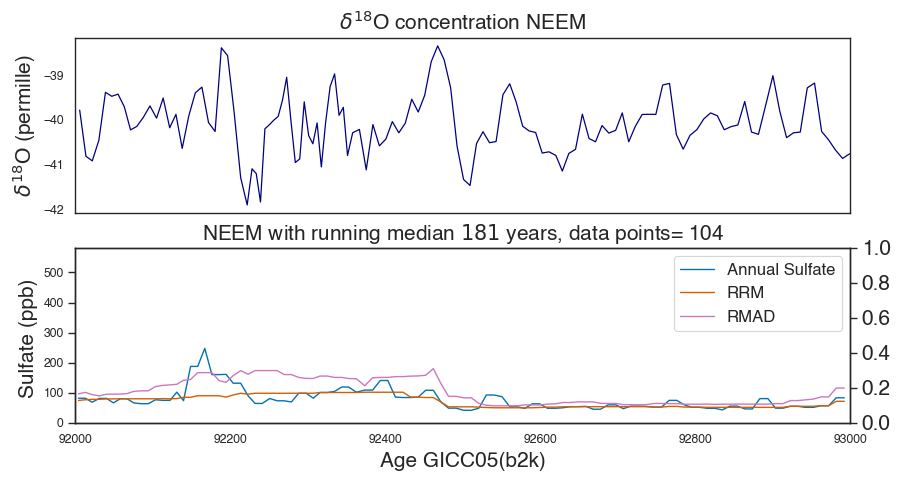

 73%|███████▎  | 83/113 [00:17<00:06,  4.53it/s]

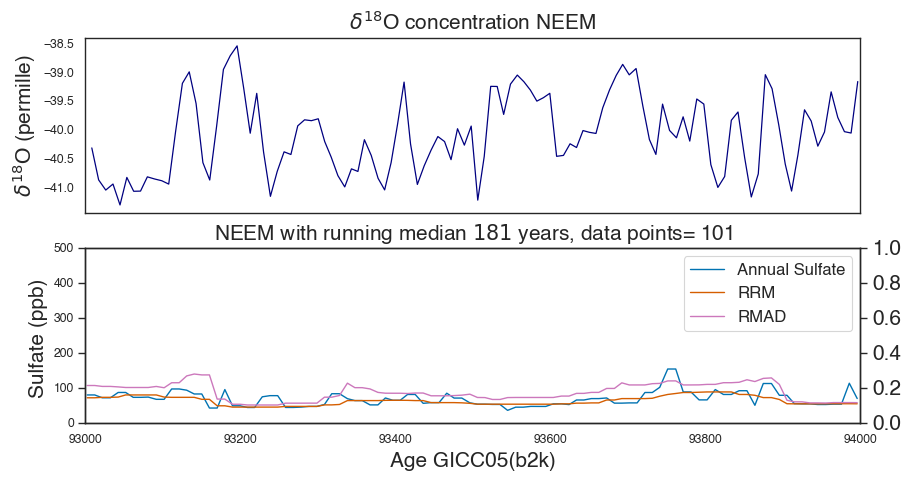

 74%|███████▍  | 84/113 [00:17<00:06,  4.15it/s]

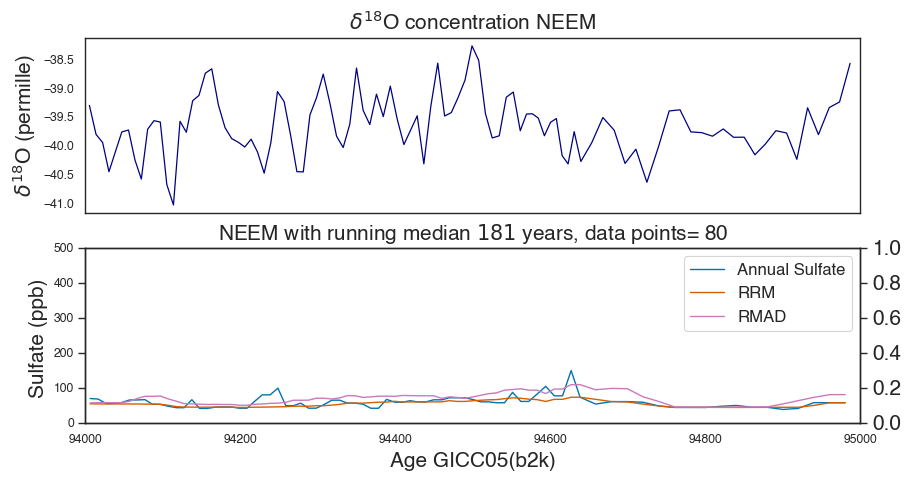

 75%|███████▌  | 85/113 [00:18<00:06,  4.37it/s]

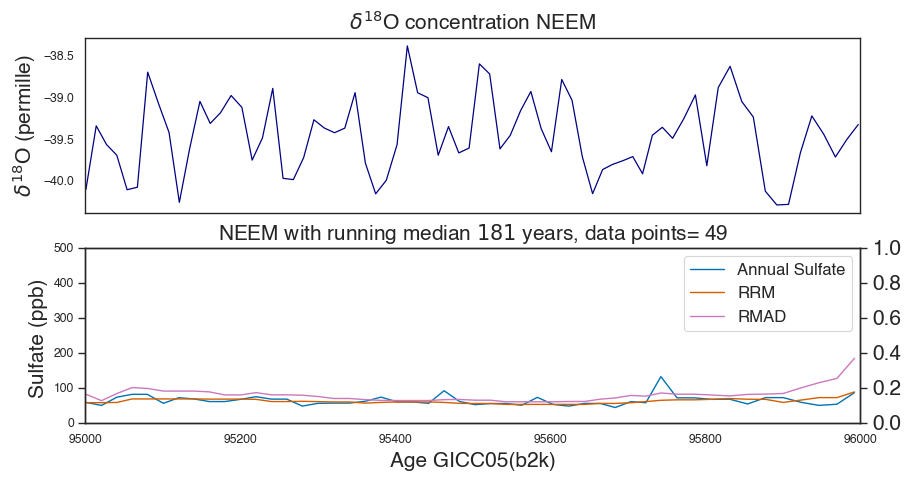

 76%|███████▌  | 86/113 [00:18<00:06,  4.48it/s]

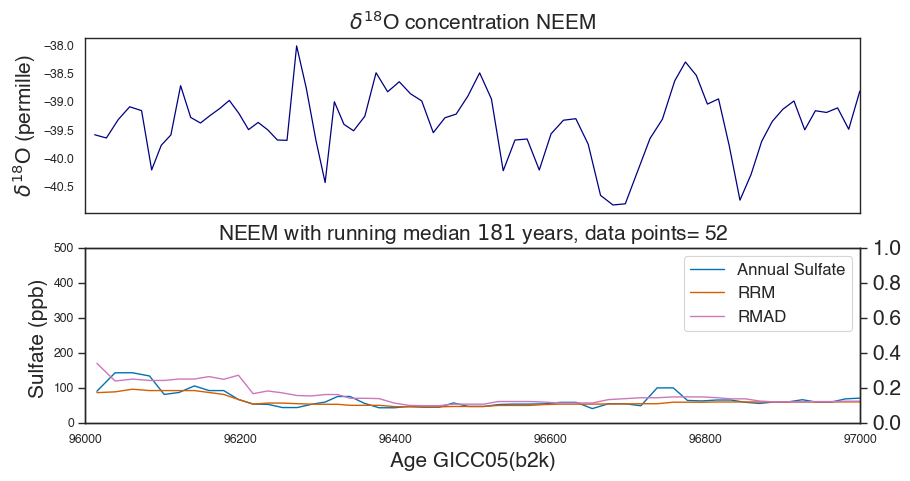

 77%|███████▋  | 87/113 [00:18<00:05,  4.60it/s]

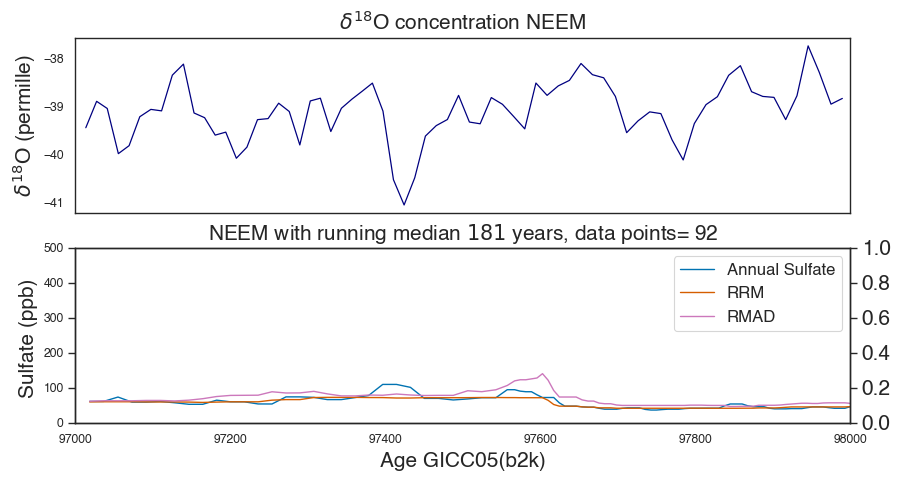

 78%|███████▊  | 88/113 [00:18<00:05,  4.73it/s]

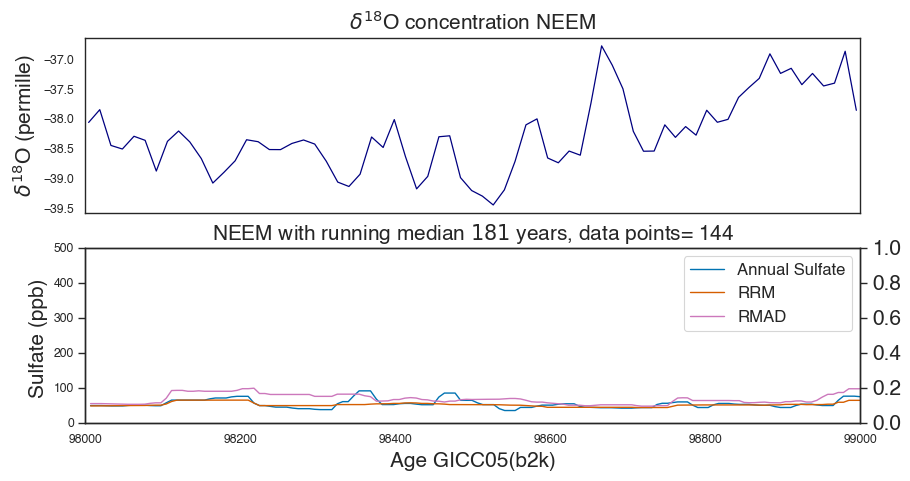

 79%|███████▉  | 89/113 [00:18<00:05,  4.69it/s]

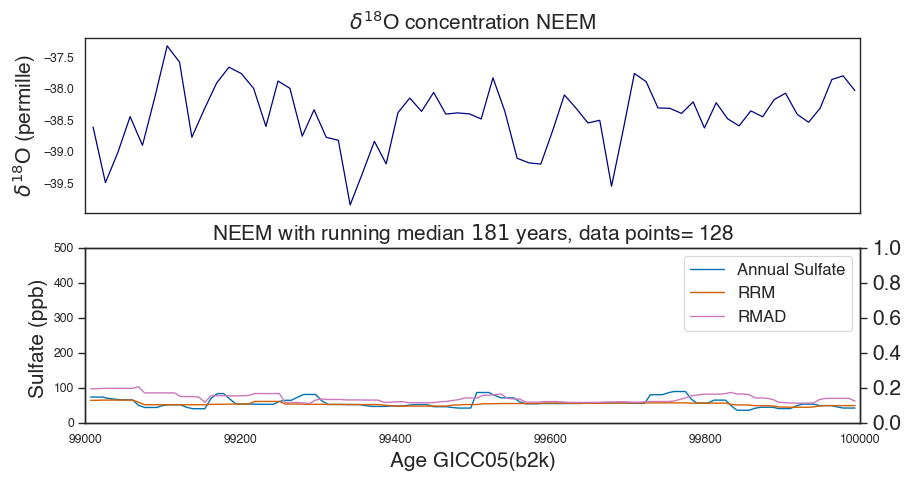

 80%|███████▉  | 90/113 [00:19<00:04,  4.83it/s]

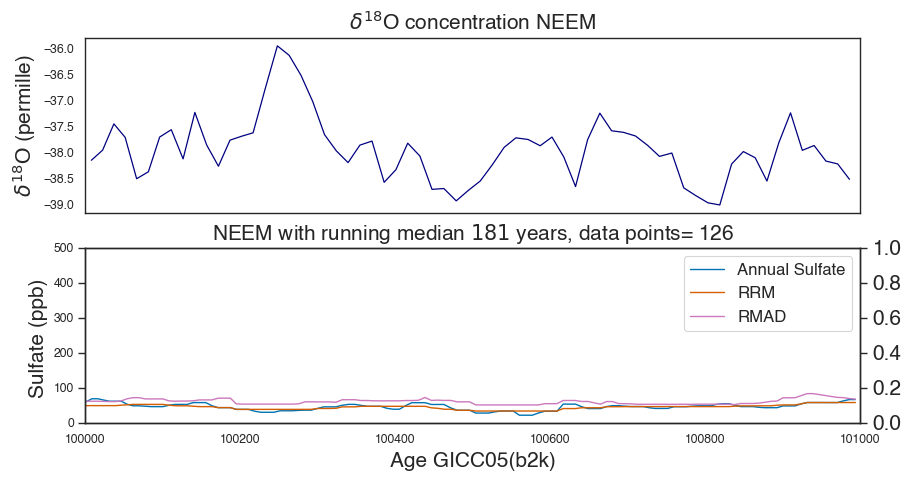

 81%|████████  | 91/113 [00:19<00:04,  4.86it/s]

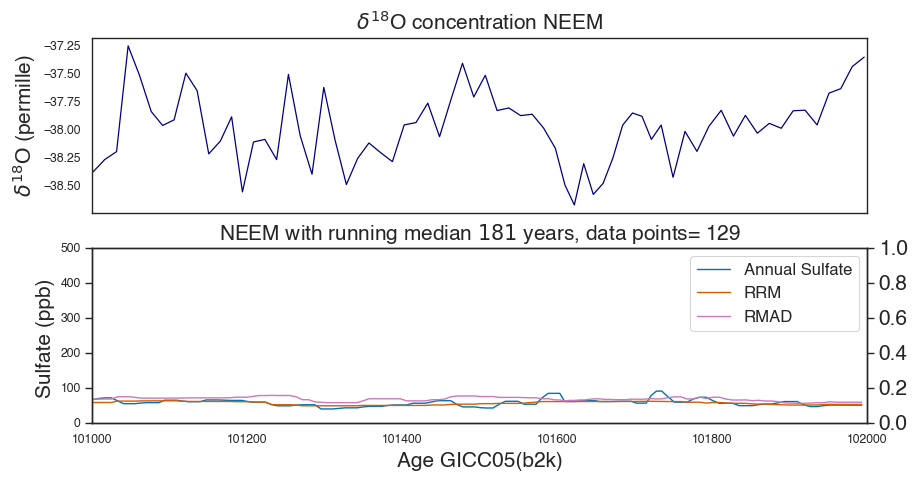

 81%|████████▏ | 92/113 [00:19<00:04,  4.41it/s]

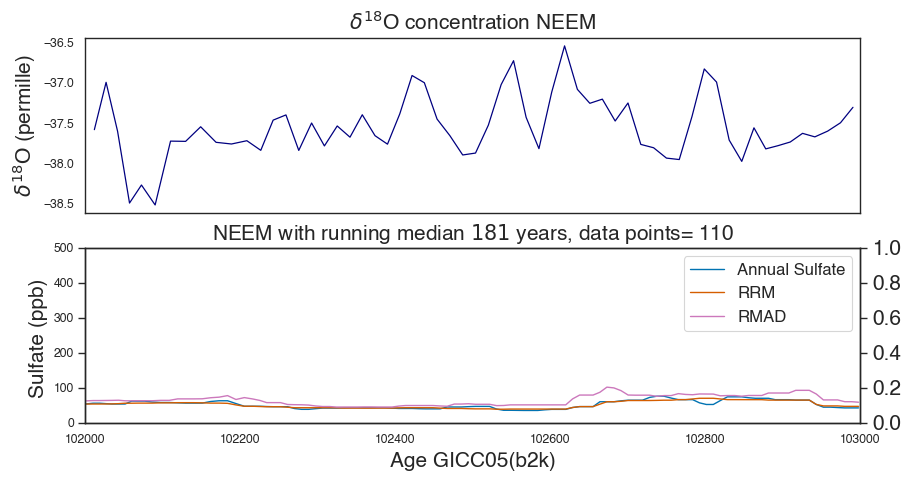

 82%|████████▏ | 93/113 [00:19<00:04,  4.59it/s]

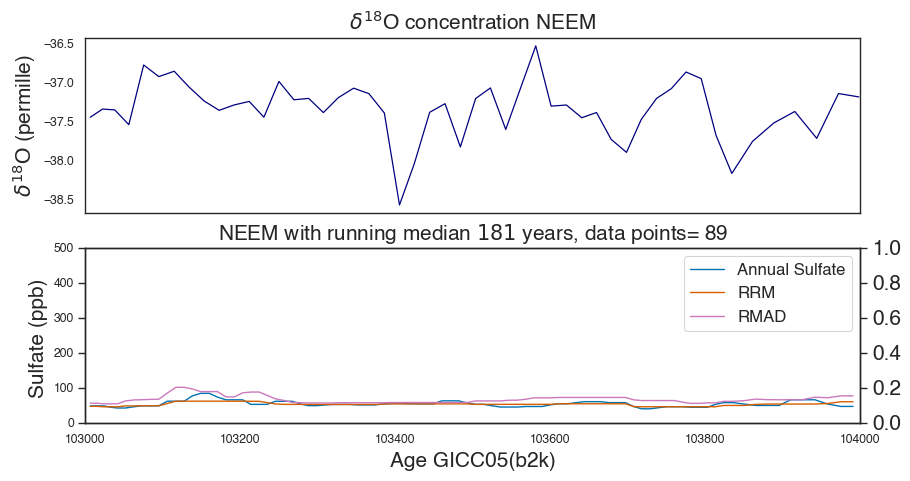

 83%|████████▎ | 94/113 [00:20<00:04,  4.74it/s]

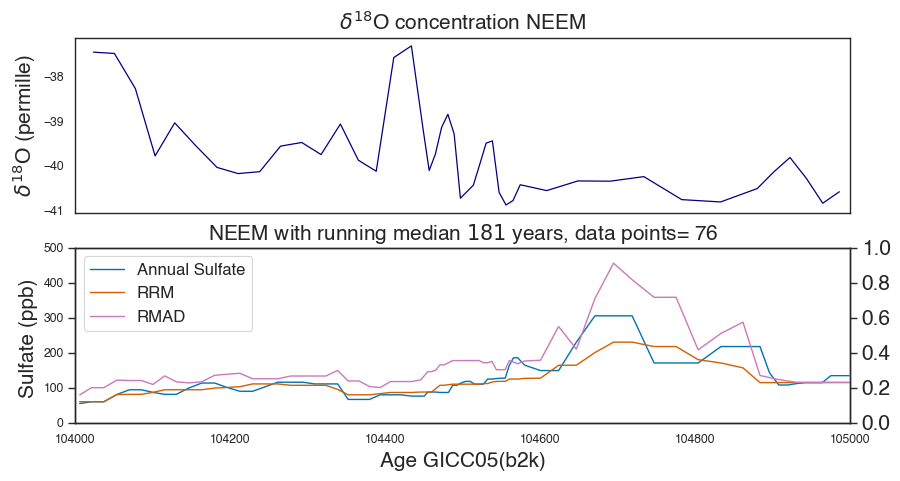

 84%|████████▍ | 95/113 [00:20<00:03,  4.81it/s]

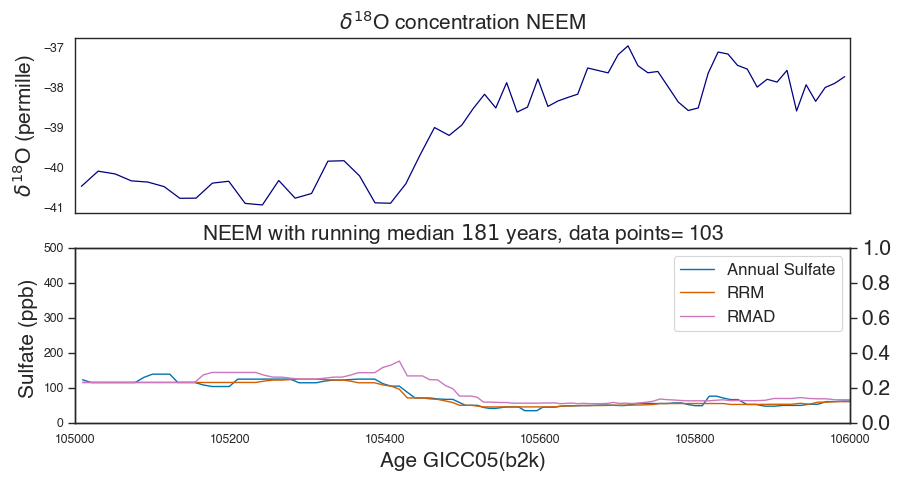

 85%|████████▍ | 96/113 [00:20<00:03,  4.92it/s]

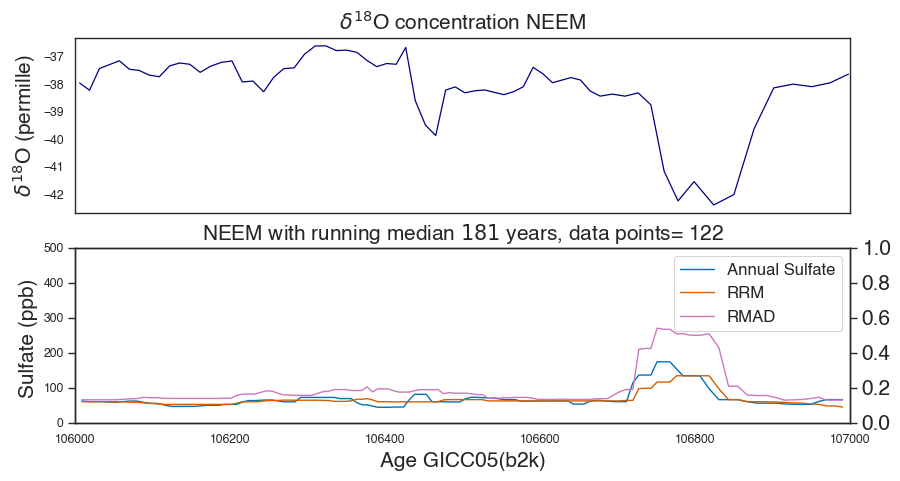

 86%|████████▌ | 97/113 [00:20<00:03,  4.88it/s]

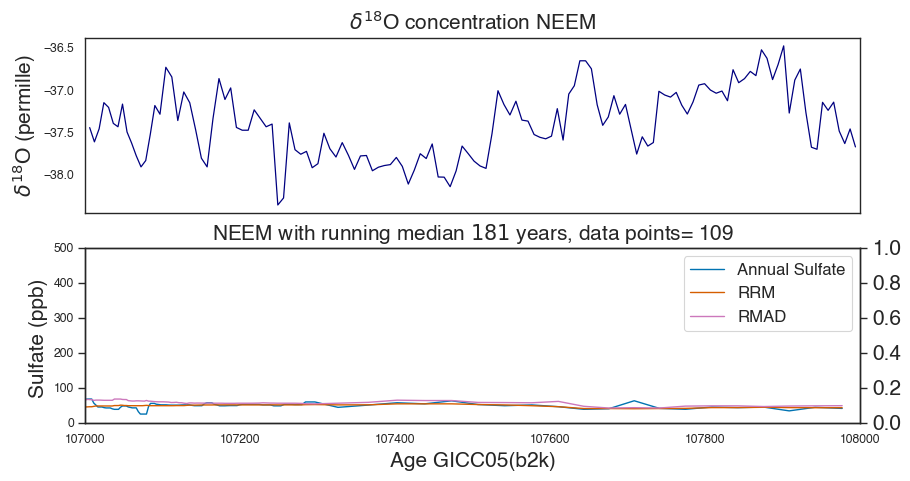

 87%|████████▋ | 98/113 [00:20<00:03,  4.95it/s]

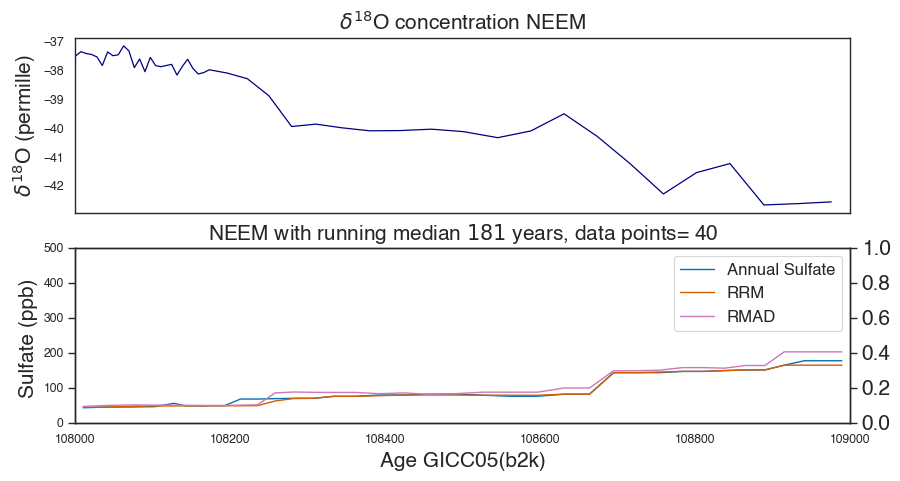

 88%|████████▊ | 99/113 [00:21<00:03,  4.66it/s]

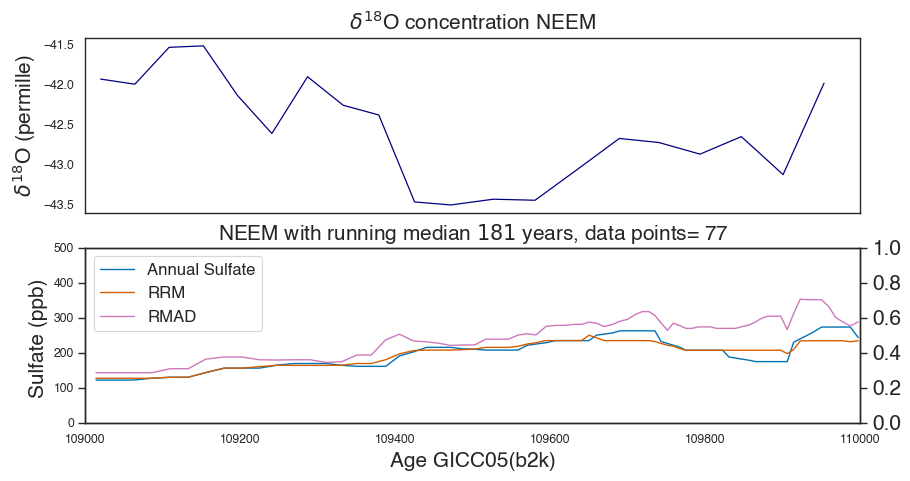

 88%|████████▊ | 100/113 [00:21<00:02,  4.41it/s]

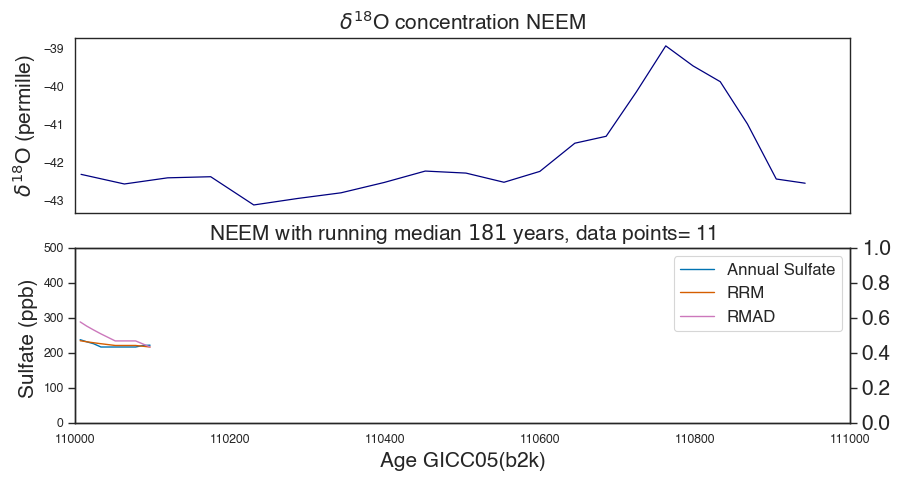

 89%|████████▉ | 101/113 [00:21<00:02,  4.48it/s]

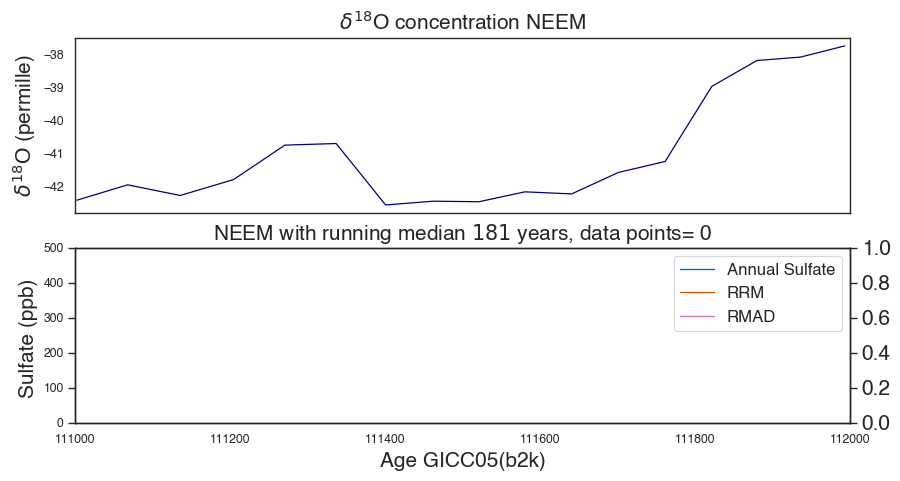

 90%|█████████ | 102/113 [00:21<00:02,  4.73it/s]

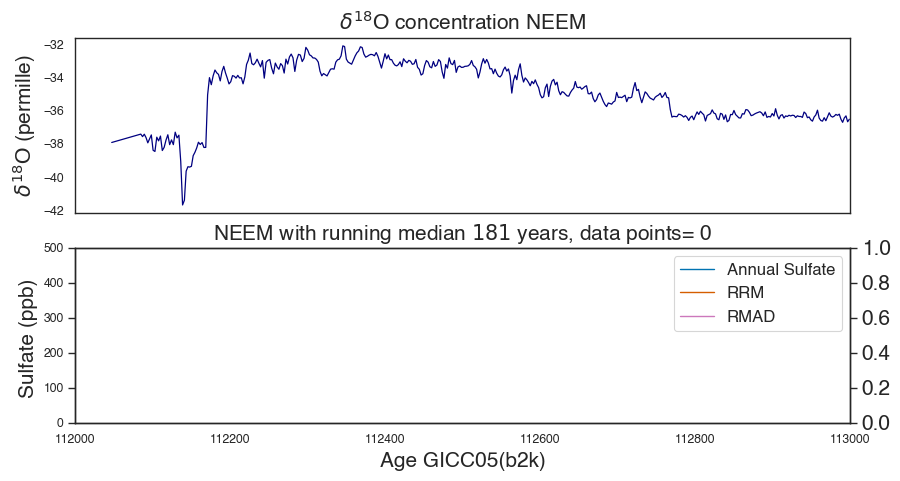

 91%|█████████ | 103/113 [00:21<00:02,  4.49it/s]

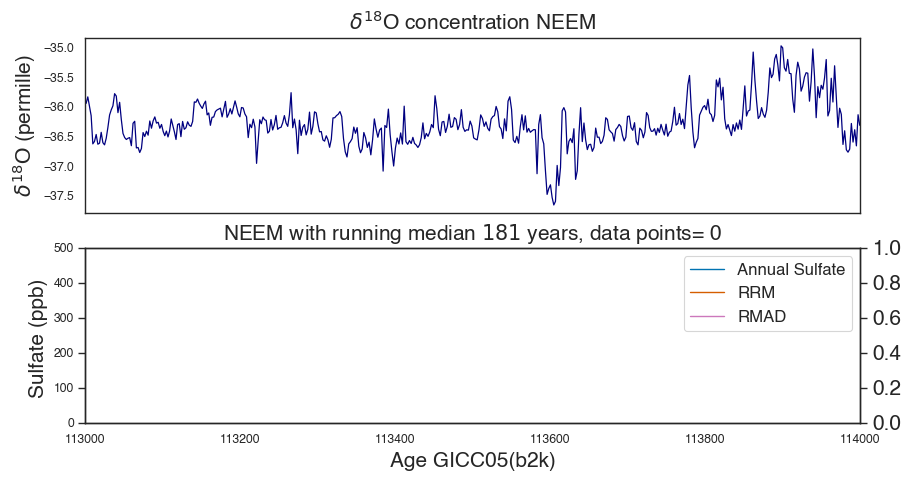

 92%|█████████▏| 104/113 [00:22<00:01,  4.72it/s]

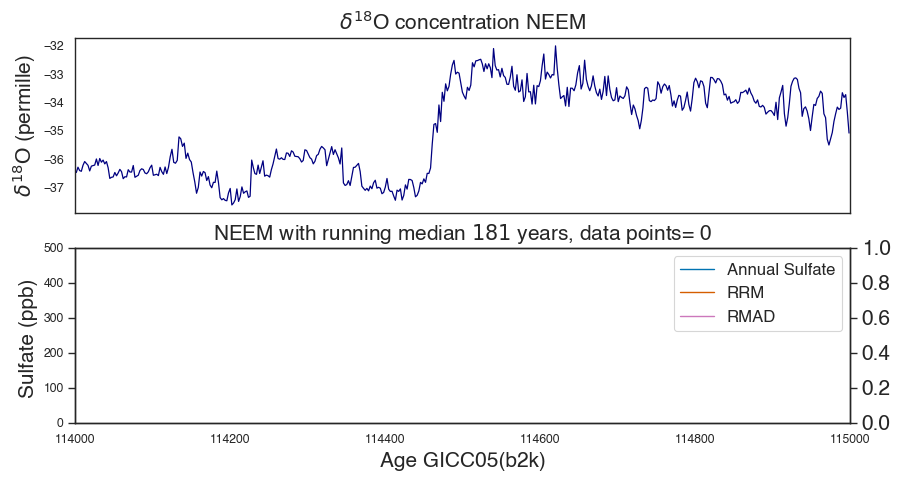

 93%|█████████▎| 105/113 [00:22<00:01,  4.77it/s]

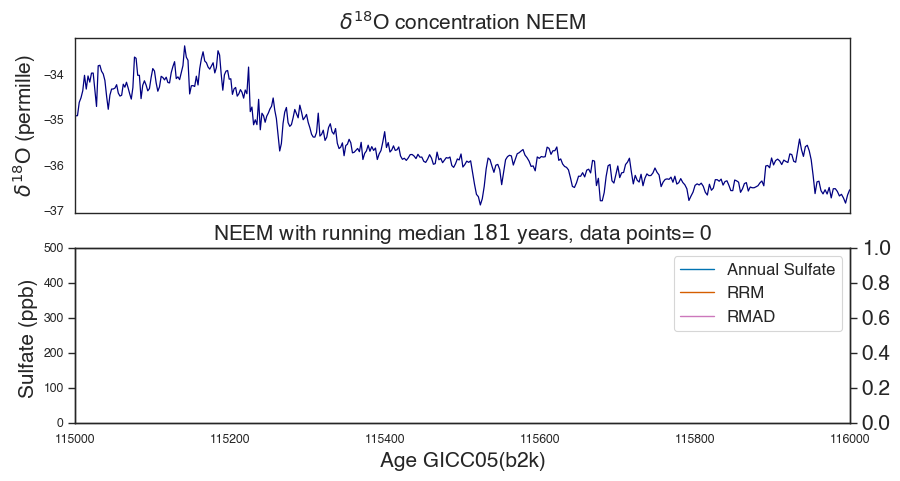

 94%|█████████▍| 106/113 [00:22<00:01,  4.97it/s]

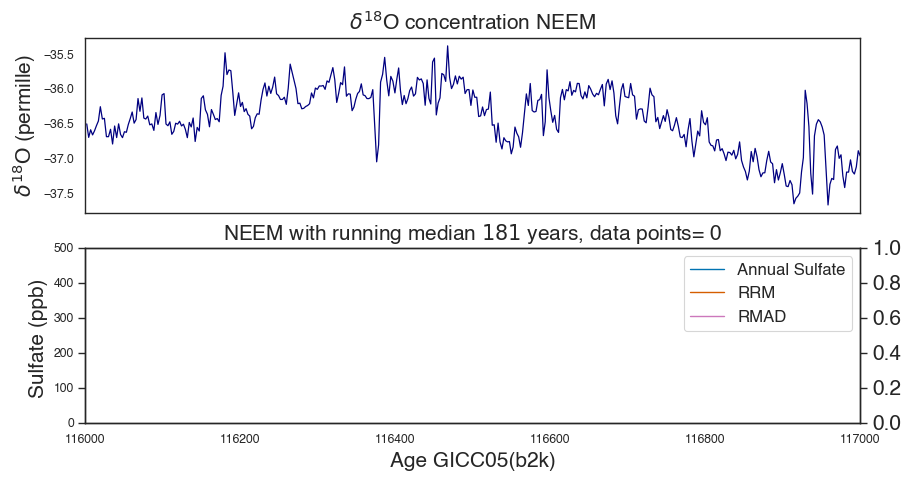

 95%|█████████▍| 107/113 [00:22<00:01,  4.82it/s]

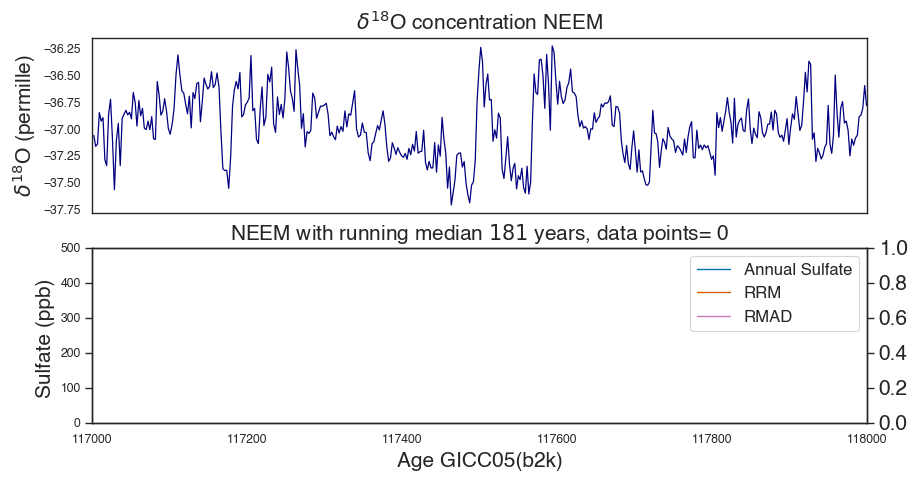

 96%|█████████▌| 108/113 [00:23<00:01,  4.29it/s]

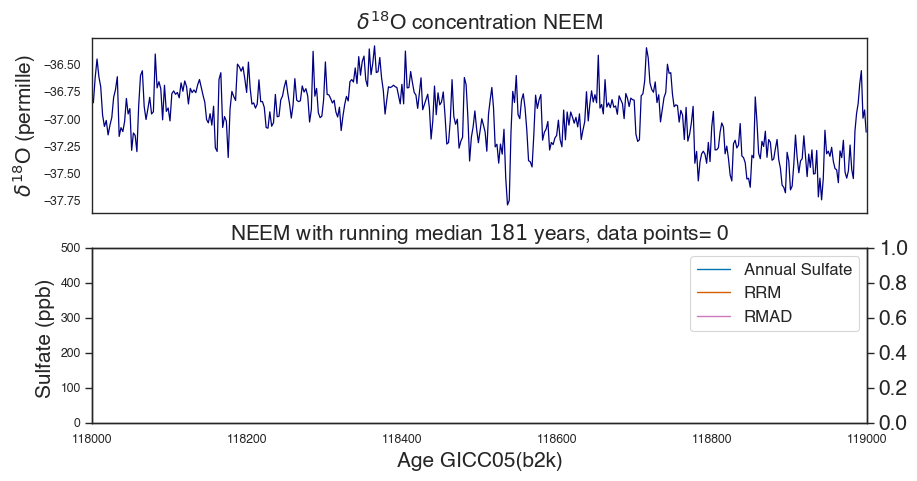

 96%|█████████▋| 109/113 [00:23<00:00,  4.37it/s]

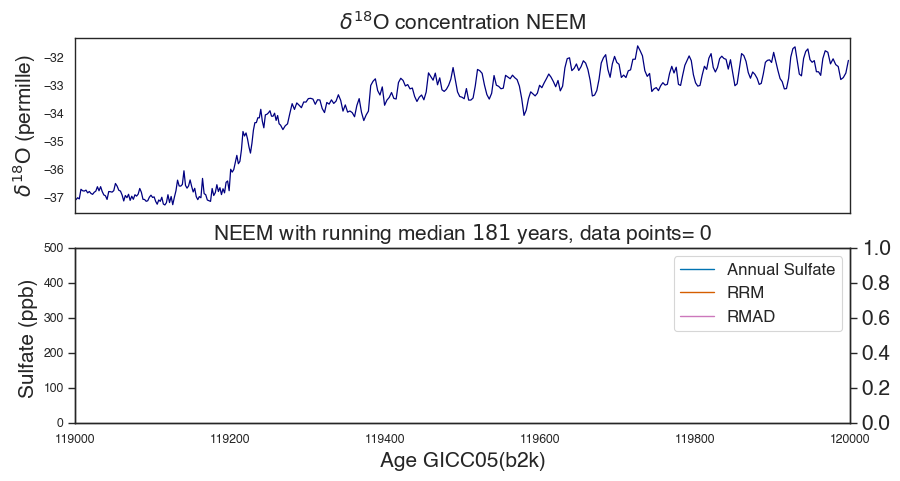

 97%|█████████▋| 110/113 [00:23<00:00,  4.63it/s]

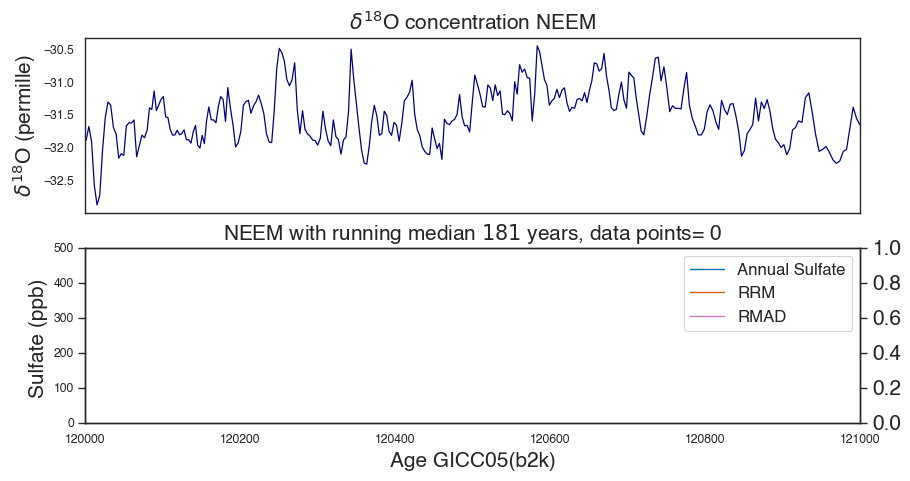

 98%|█████████▊| 111/113 [00:23<00:00,  4.52it/s]

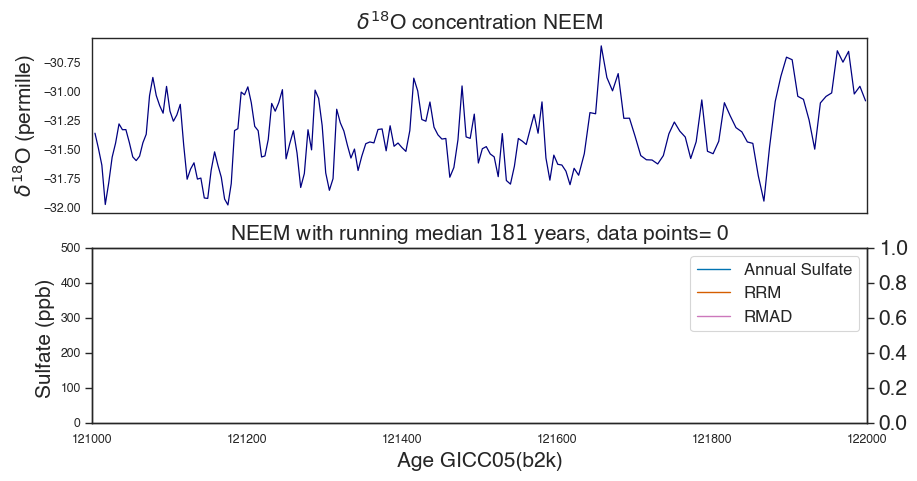

 99%|█████████▉| 112/113 [00:23<00:00,  4.75it/s]

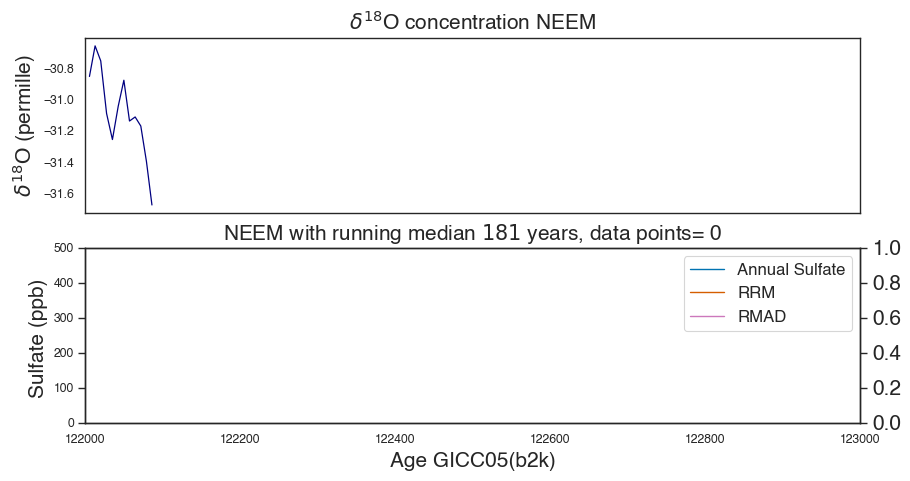

100%|██████████| 113/113 [00:24<00:00,  4.69it/s]


In [34]:
%matplotlib inline
%store -r NEEM_missing_depth
NEEM_missing_depth = np.array(NEEM_missing_depth)
data_points=[]
age_bp = np.interp(depth_bp_NEEM, NEEM_depth[lim_NEEM], NEEM_age)
NEEM_missing_age = np.interp(NEEM_missing_depth, NEEM_depth[lim_NEEM], NEEM_age)
NEEM_ECM_age = np.interp(NEEM_ECM_depth, NEEM_depth[lim_NEEM], NEEM_age)
age_bp_NEEM = np.interp(depth_bp_NEEM[~np.isnan(depth_bp_NEEM)], NEEM_depth[lim_NEEM], NEEM_age)
age_missing_NEEM = np.interp(depths_lost_NEEM, NEEM_depth[lim_NEEM], NEEM_age)

for i in tqdm(range(0,len(NEEM_age_list)-1)):
    idx = np.where((NEEM_age >= NEEM_age_list[i]) & (NEEM_age <= NEEM_age_list[i+1]))
    NEEM_annual_s = NEEM_age[idx]
    NEEM_annual_sulfate_interp_s = NEEM_sulfate[idx]
    
    if len(NEEM_annual_s) == 0:
        idx_all = np.where((NEEM_age > NEEM_age_list[i]) & (NEEM_age < NEEM_age_list[i+1]))
        idx_bp = []
        idx_lost = []
        
    else:
        idx_all = np.where((NEEM_age > NEEM_age_list[i]) & (NEEM_age < NEEM_age_list[i+1]))
        idx_bp = np.where((NEEM_missing_age < NEEM_annual_s[-1]) & (NEEM_missing_age > NEEM_annual_s[0]))
        idx_lost  = np.where((age_missing_NEEM < NEEM_annual_s[-1]) & (age_missing_NEEM > NEEM_annual_s[0]))
    colors = ['k', 'm', 'g', 'k', 'm', 'g', 'k', 'm', 'g', 'k', 'm', 'g']
    
    NEEM_sulfate_count = len(NEEM_age[idx_all])
    
    data_points.append(NEEM_sulfate_count)
        
    idx_ox = np.where((NEEM_d18O_age >= NEEM_age_list[i]) & (NEEM_d18O_age <= NEEM_age_list[i+1]))
    
    #if i == 3:

    f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(10, 5))
    
    ax3 = ax2.twinx()
    
    ax1.set_title('$\delta^{18}$O concentration NEEM', fontsize=15)
    ax1.plot(NEEM_d18O_age[idx_ox], NEEM_d18O[idx_ox], color='navy',linewidth=.9)
    ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
    #ax1.set_ylim(-47,-31)
    
    ax2.plot(NEEM_age[idx], NEEM_sulfate[lim_NEEM][idx], linewidth=1, label = 'Annual Sulfate', color='b')
    ax2.plot(NEEM_age[idx], NEEM_RRM[idx], linewidth = 1, label = 'RRM', color='r')
    ax2.plot(NEEM_age[idx], NEEM_RMAD[idx], linewidth=1, label='RMAD', color='m')
    #plt.plot(NEEM_annual_s, NEEM_RMAD[idx], linewidth=1, label = 'RMAD', color='gold')
    ax2.set_ylim(0,2500)
    ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
    ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax2.set_xlim(NEEM_age_list[i], NEEM_age_list[i+1])
    ax2.set_ylim(0,np.nanmax(NEEM_annual_sulfate_interp_s,initial=250) + 250)
    #ax2.plot(NEEM_annual_s, NEEM_RRM[idx]*1.3)
    ax2.set_title('NEEM with running median $'+str(NEEM_filt)+'$ years, data points= ' + str(NEEM_sulfate_count), fontsize=15)
    
    idx_ECM = np.where((NEEM_ECM_age > NEEM_age_list[i]) & (NEEM_ECM_age  < NEEM_age_list[i+1]))
    #ax3.plot(NEEM_ECM_age[idx_ECM], NEEM_ECM[idx_ECM], color = 'm')
    #ax3.set_ylim(0,np.nanmax(NEEM_ECM[idx_ECM], initial=0.0) + 5)
    #ax3.set_xlim(NEEM_age_list[i], NEEM_age_list[i+1])
    
    #if i == 20:
    #plt.savefig('NEEM_' + str(NEEM_annual_s[-1])+ '_' + str(NEEM_annual_s[0]) + '_' + str(NEEM_filt) + '_RM._oxygen.jpg', dpi=1000, bbox_inches='tight')
    if len(idx_bp) != 0:
        for j in range(len(age_missing_NEEM[idx_lost])):
            ax2.axvline(x=age_missing_NEEM[idx_lost][j], ymin=0, ymax=1, color=colors[j], linewidth=.5, label = str(depths_lost_NEEM[idx_lost][j]))
    ax2.legend(fontsize=12)
    plt.show()
    #else: 
        #continue

In [35]:
NEEM_filt_list = NEEM_filt*np.ones(len(NEEM_age_list))
print(tabulate({'Data res.': data_points, 'Interval1': NEEM_age_list[:-1], 'Interval2': NEEM_age_list[1:], 'Filter': NEEM_filt_list[:-1]}, headers="keys", tablefmt='fancy_grid'))

╒═════════════╤═════════════╤═════════════╤══════════╕
│   Data res. │   Interval1 │   Interval2 │   Filter │
╞═════════════╪═════════════╪═════════════╪══════════╡
│           0 │       10000 │       11000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│           0 │       11000 │       12000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│          87 │       12000 │       13000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│         100 │       13000 │       14000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│         100 │       14000 │       15000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│         100 │       15000 │       16000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│         104 │       16000 │       17000 │      181 │
├─────────────┼─────────────┼─────────────┼──────────┤
│          99 │       17000 │       18000 │      181 │
├─────────

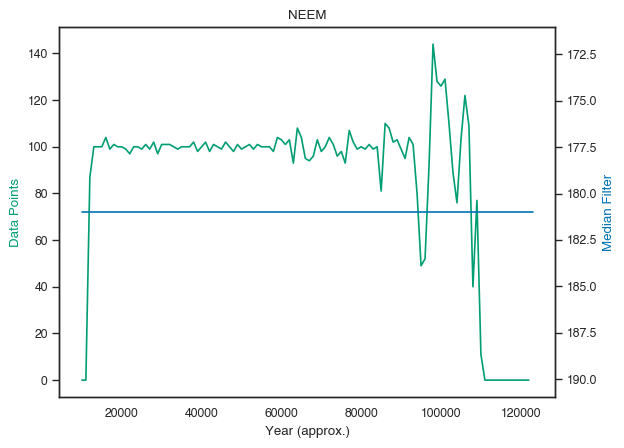

In [36]:
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(NEEM_age_list[:-1], data_points, 'g')
ax2.plot(NEEM_age_list, NEEM_filt_list, 'b')

ax1.set_xlabel('Year (approx.)')
ax1.set_ylabel('Data Points', color='g')
ax2.set_ylabel('Median Filter', color='b')
ax2.invert_yaxis()
plt.title('NEEM')
plt.savefig('NEEM_data_points')












plt.show()

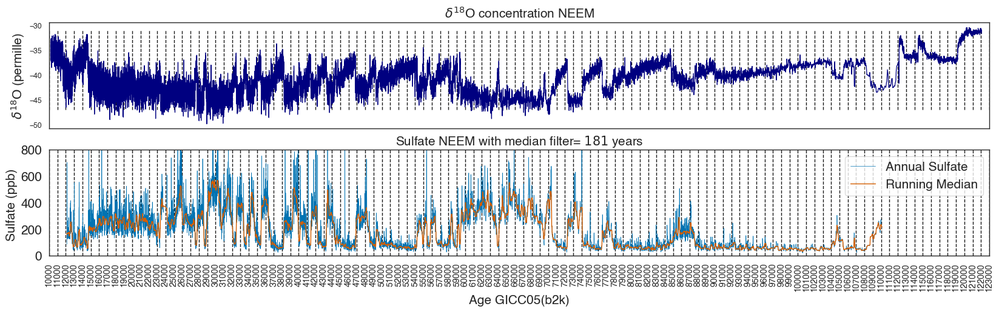

In [37]:
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(20,5), sharex=True)

label_vlines = np.arange(1,len(NEEM_age_list)+1,1)

NEEM_age_list_int = [int(x) for x in NEEM_age_list]

ax1.vlines(NEEM_age_list, -47,-31, color='k', linestyle='--', linewidth=1)

ax1.set_title('$\delta^{18}$O concentration NEEM', fontsize=15)
ax1.plot(NEEM_d18O_age, NEEM_d18O, color='navy', linewidth=.9)
ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
#ax1.set_ylim(-47,-31)
ax1.set_xlim(NEEM_annual[0], NEEM_annual[-1])

ax2.vlines(NEEM_age_list, 0,3000, color='k', linestyle='--', linewidth=1)

ax2.set_title('Sulfate NEEM with median filter= $'+str(NEEM_filt)+'$ years', fontsize=15)
ax2.plot(NEEM_age, NEEM_sulfate[lim_NEEM], linewidth=.5, label = 'Annual Sulfate', color='b')
ax2.plot(NEEM_age, NEEM_RRM, linewidth = 1, label = 'Running Median', color='r')
#ax1.plot(NEEM_annual_s, NEEM_MAD[idx], linewidth=1, label = 'MAD', color='gold')
ax2.legend(fontsize=15, loc='best')
ax2.set_ylim(0,800)
ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
plt.xticks(NEEM_age_list, NEEM_age_list_int, fontsize=10,rotation=90)
plt.yticks(fontsize=15)
plt.xlabel('Age GICC05(b2k)', fontsize=15)
#ax2.set_xlim(NEEM_age_list[i], NEEM_age_list[i+1])
plt.savefig('NEEM_' + str(NEEM_filt) + '_RM_d18O_intevals.jpg', dpi=1000, bbox_inches='tight')
plt.show()